# Final Project
## Binary Classification Problem for Low Size Tabular Data Using Parallel Processing.

# Abstract

## Introduction

Machine learning algorithms have become a very essential tool in the fields of math and engineering, as well as for industrial purposes (fabric, medicine, sport, etc.). This research leverages classical machine learning algorithms for innovative accurate and efficient fabric protrusion detection. We present an approach for improving model training with a small dataset. We use a few classic statistics machine learning algorithms (decision trees, logistic regression, etc.) and a fully connected neural network (NN) model. We also present an approach to optimize a model accuracy rate and execution time for finding the best accuracy using parallel processing with Dask (Python).

Machine learning (ML) models require substantial training datasets. A special challenge is encountered when the training dataset is not large enough. Optimizing a ML model with a small dataset might lead to overfitting, whereas the model training accuracy rate is usually high, but its capacity is insufficient to care with new data. In this paper, we present several models and our best solution for classifying fabric appearance. Machinelearning enables data-driven models to “learn” information about a system directly from observed data. They are increasingly becoming the core technology of choice for numerous applications, such as weather forecasting, DNA sequencing, Internet search engines, stock market real-time predictions, and more. Nevertheless, ML systems are rarely used when there are small datasets, that is, when an insufficient number of training samples can compromise the learning accuracy[1,2]. In practical applications, the dataset is often imbalanced, which might lead to nonideal training. To address this challenge, we have employed some preprocessing, e.g., feature selection and engineering, smoothing techniques, scaling, and normalization.

In this research, we are proposing a machine learning approach for classifying the surface quality of a two-dimensional random field. The classification is based on estimating random field outlier parameters.

In order to improve the outlier detection accuracy, a random field is presented as a set of profiles in parallel sections, each of which is an implementation of a one-dimensional random field process. One advantage of replacing the 2D random field image with a set of 1D profile images is the ability to detect outliers against a fixed background.

Surface defects in fabrics are one of the most challenging problems in textile and apparel industries. The most common defects are the structural failure of the fabric and defects related to protruding separate fibers or group of fibers from the fabric surface. The most common types of fabric surface defect are pilling, fuzziness, snagging, and hairiness. The classification range is 1–5, whereas the best grade is 5 (no protrusions at all) and the worst is 0. The score is traditionally obtained through the use a standard test method. In this research work, we present a fabric appearance classification approach based on data which has been obtained using a specific method of image processing parameterization [3,4]. 

The problem of textile surface quality evaluation has been widely explored in the literature during the last 25 years [5–11]. Several sources mentioned the use of image processing techniques for fabric defect evaluation [8,9,12–16]. The methods used for fabric defect localization and evaluation include Fourier transform [13,16], artificial neural networks [17–22], fuzzy logic method [5,7,13,19], wavelet analysis [21–25], and others. Common to all these works is the use of 2D fabric images as the analysis starting point. The traditional approach is based on Gaussian fit theory and threshold grading for linear convolution of pills parameters [13]. The application of machine learning to real-world problems presents a few challenges—it requires domain specialists to label data samples [26], it might be influenced by the type of the data preprocessing and tuning of algorithm parameters, thus requiring running several machine learning experiments before achieving satisfactory results [27]. 
An additional challenge is model performance assessment with small datasets. In this work we handle small data sets situations [27,28]. We compare the accuracy score nof neural network, decision tree, random forest, logistic regression, and choose the best algorithm for the fabric surface quality classification application. The use of the proposed system comes to give a different approach, where instead of using a convolutional neural network, we use a fixed parameters that has been extracted from a set of images. The given parameters are mentioned in the research below. 

The given approach can cause better results while handling a low amount of data, where there the model can learn some unimportant features.

We also gives a new approach of finding the best hyperparameters while using parallel processing in order to reduce the execution time.

# Import Required Libraries

- Numpy, Pandas, Matplot, and Seaborn for Data Analysis and Visualizations
- ipywidgets, Sweetviz, ppscore for EDA (Exploratory Data Analysis)
- Sklearn, Imblearn for Machine Learning Modelling

In [1]:
# Import important Libraries
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
import numpy as np
import plotly.express as px
from sklearn import preprocessing
from sklearn.metrics import r2_score, mean_squared_error
from sklearn import utils
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
import keras.backend as K
from sklearn.tree import plot_tree
from IPython.display import Image
from tensorflow.keras.utils import plot_model
import time
import sys
import cv2
from PIL import Image, ImageDraw
from skimage import color
from skimage import io
import keras
import pydot
import pydotplus
from pydotplus import graphviz
from keras.utils.vis_utils import plot_model
from keras.utils.vis_utils import model_to_dot
keras.utils.vis_utils.pydot = pydot
import dask
import dask.delayed as delayed
from dask.distributed import Client, LocalCluster
from sklearn.ensemble import BaggingClassifier
import matplotlib.pyplot as pyplot
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from mlxtend.evaluate import bias_variance_decomp
from sklearn.model_selection import ShuffleSplit
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
import xgboost as xgb
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics
from sklearn.model_selection import KFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn import svm
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
import warnings
import numpy as np
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import plotly.graph_objs as go
from plotly.colors import DEFAULT_PLOTLY_COLORS
warnings.filterwarnings('ignore')

# Display bigger size of data frames
pd.set_option('display.max_columns', 500)
pd.set_option('display.min_row', 5505)

C:\Users\kazom\anaconda3\lib\site-packages\xgboost\compat.py:31: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


# Image Processing

Here we wanted to convert an image to a matrix, which there we can manipulate any kind of operation that we want on each pixel:
* First we converted each pixel to 255 (=White) or 0 (=Black), by the next equation:
* $ f_{X} = \frac{X}{255} $, Where X=Pixel
* If $ f_{X} > 0.5 $, Convert the pixel to 255, else convert it to 0.

Now, we can clearly define the limits between the fabric to it's background.

Then, we wanted to calculate standard deviation and average for each row, where each row has the same number of elements.
- Standard Devitation = $ \sqrt{\frac{1}{N-1} \sum_{i=1}^N (x_i - \overline{x})^2} $
- Average = $ \frac{\sum \limits _{i=1} ^{N} X{_i}}{N}  $

What we clearly see, that where there are rows that it's standard deviation > 0 and it's average < 255 or average > 0, there are protrusion, and our estimation it's that the more rows that includes these difference and where the standard devitation is higher and the more that the average of the row tends to the middle between 255 to 0 (=122.5), the more protrusion that appears in the fabric.

In [2]:
#Load the image
image = Image.open("newimg.jpg")

We use a dataset that was created in 2010 for the textile and apparel industries. The parameterization of the original study is not included in this research. We begin from preprocessing of the data for implementing any machine learning classification algorithms.
An example of the fabric’s 2D image of the fabric is illustrated in the Figure below.

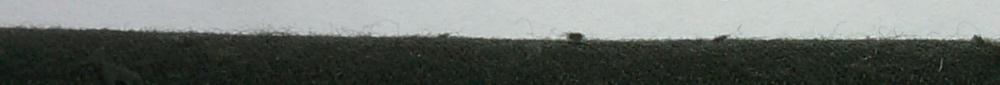

In [3]:
image

In [4]:
#Create a function that convert the image to 255 or 0 and prints average pixels and std
def ArrayTo255Or0(image):
    image_array = np.array(image)
    print(f"Size of photo 1: {image_array.shape}")
    array = np.where(image_array/255 >= 0.5, 255, 0)
    print(f"Image Array after converting to 255 or 0: {array}")
#     print('Average pixels per row:')
    print(array.shape)
    i = 0
    for row in array:
        print("Row number is:" ,i)
        print("Average Pixels for row",np.mean(row))
        print("Standart Devitation for row",np.std(row))
        i = i + 1
    print('Average pixels for all Image is:')
    print(np.mean(array))
    print("Standart Devitation:")
    print(np.std(array))

In [5]:
#apply the function above on a random image from our data
ArrayTo255Or0(image)

Size of photo 1: (132, 1536, 3)
Image Array after converting to 255 or 0: [[[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 [[255 255 255]
  [255 255 255]
  [255 255 255]
  ...
  [255 255 255]
  [255 255 255]
  [255 255 255]]

 ...

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]

 [[  0   0   0]
  [  0   0   0]
  [  0   0   0]
  ...
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]]]
(132, 1536, 3)
Row number is: 0
Average Pixels for row 255.0
Standart Devitation for row 0.0
Row number is: 1
Average Pixels for row 255.0
Standart Devitation for row 0.0
Row number is: 2
Average Pixels for row 255.0
Standart Devitation for row 0.0
Row number is: 3
Average Pixels for row 255.0
S

# Reading and Preprocessing the Data

In [6]:
# Read the data from the images
FullData = pd.read_excel('Data From Images.xlsx')
FullData

,ExpNum,Test,Date,Code,Color,Revol.,Spec.,Direc,H/P,Comp.,Pill correct,Pill,Fuzz,Loc.,Brightness,Shade,C_P,W_P,H_P,A_P,D_P,RB_P,MH_P,FA_P,NB_P
0,18,89.0,1.11.05,kp/05-16,brown D,100,unw,NaN,4.0,NaN,NaN,NaN,NaN,NaN,18.40,2,0.35,2.85,0.76,1.35,0.00,0.64,1.00,1.56,21.03
1,18,NaN,NaN,NaN,brown D,100,washed,NaN,3.0,NaN,NaN,NaN,NaN,NaN,16.80,2,0.85,2.03,0.86,1.09,0.24,0.61,1.00,1.30,19.99
2,18,NaN,NaN,NaN,brown D,100,1,W,3.5,NaN,3.0,3.5,3.0,NaN,17.00,2,0.85,2.31,0.83,1.18,0.13,0.60,1.05,1.48,20.54
3,18,NaN,NaN,NaN,brown D,100,2,L,3.5,NaN,2.0,3.5,3.0,NaN,17.95,2,0.95,1.99,0.88,0.96,0.31,0.61,1.03,1.12,20.59
4,18,NaN,NaN,NaN,brown D,100,3,L,3.5,NaN,3.0,3.5,3.0,NaN,17.60,2,1.10,1.78,1.01,1.02,0.42,0.65,1.24,1.26,18.30
5,18,NaN,NaN,NaN,brown D,100,4,W,3.5,NaN,2.0,3.5,3.0,NaN,16.60,2,0.45,1.83,0.82,0.89,0.22,0.67,1.03,1.06,21.08
6,19,90.0,1.11.05,kp/05-13,orange M,100,unw,NaN,4.0,NaN,NaN,NaN,NaN,NaN,23.00,3,0.40,1.90,0.74,0.82,0.15,0.65,0.84,0.94,23.59
7,19,NaN,NaN,NaN,orange M,100,washed,NaN,3.0,NaN,NaN,NaN,NaN,NaN,22.90,3,0.90,2.07,0.76,0.90,0.29,0.65,0.94,1.04,21.92
8,19,NaN,NaN,NaN,orange M,100,1,L,3.0,NaN,2.0,2.5,2.0,NaN,24.15,3,1.30,1.88,0.91,1.03,0.55,0.65,1.18,1.27,18.96
9,19,NaN,NaN,NaN,orange M,100,2,W,3.0,NaN,3.0,3.0,2.0,NaN,22.20,3,1.05,2.31,0.91,1.23,0.32,0.62,1.11,1.51,19.19


In [7]:
# Shape of the data
print('Shape of the Data Set: ', FullData.shape)
print('Data Columns: ', FullData.columns)

Shape of the Data Set:  (582, 25)
Data Columns:  Index(['ExpNum', 'Test', 'Date', 'Code', ' Color', 'Revol.', 'Spec.', 'Direc',
       'H/P ', 'Comp.', 'Pill correct', 'Pill', 'Fuzz', 'Loc. ', 'Brightness',
       'Shade', 'C_P', 'W_P', 'H_P', 'A_P', 'D_P', 'RB_P', 'MH_P', 'FA_P',
       'NB_P'],
      dtype='object')


In [8]:
# Rename the Coloumns to their full name description
FullData.rename(columns={
    'C_P': 'Average Number of Protrusions',
     'W_P': 'Average Width of Protrusions',
    'H_P': 'Average Height of Protrusions',
    'A_P': 'Average Area of Protrusions',
    'D_P': 'Average Distance Between Protrusions',
    'RB_P': 'Relative Brightness',
    'MH_P': 'Max Height',
    'FA_P': 'Full Area',
    'NB_P': 'Normalized Brightness',
    'Pill': 'Score',
                    },inplace=True)
FullData

,ExpNum,Test,Date,Code,Color,Revol.,Spec.,Direc,H/P,Comp.,Pill correct,Score,Fuzz,Loc.,Brightness,Shade,Average Number of Protrusions,Average Width of Protrusions,Average Height of Protrusions,Average Area of Protrusions,Average Distance Between Protrusions,Relative Brightness,Max Height,Full Area,Normalized Brightness
0,18,89.0,1.11.05,kp/05-16,brown D,100,unw,NaN,4.0,NaN,NaN,NaN,NaN,NaN,18.40,2,0.35,2.85,0.76,1.35,0.00,0.64,1.00,1.56,21.03
1,18,NaN,NaN,NaN,brown D,100,washed,NaN,3.0,NaN,NaN,NaN,NaN,NaN,16.80,2,0.85,2.03,0.86,1.09,0.24,0.61,1.00,1.30,19.99
2,18,NaN,NaN,NaN,brown D,100,1,W,3.5,NaN,3.0,3.5,3.0,NaN,17.00,2,0.85,2.31,0.83,1.18,0.13,0.60,1.05,1.48,20.54
3,18,NaN,NaN,NaN,brown D,100,2,L,3.5,NaN,2.0,3.5,3.0,NaN,17.95,2,0.95,1.99,0.88,0.96,0.31,0.61,1.03,1.12,20.59
4,18,NaN,NaN,NaN,brown D,100,3,L,3.5,NaN,3.0,3.5,3.0,NaN,17.60,2,1.10,1.78,1.01,1.02,0.42,0.65,1.24,1.26,18.30
5,18,NaN,NaN,NaN,brown D,100,4,W,3.5,NaN,2.0,3.5,3.0,NaN,16.60,2,0.45,1.83,0.82,0.89,0.22,0.67,1.03,1.06,21.08
6,19,90.0,1.11.05,kp/05-13,orange M,100,unw,NaN,4.0,NaN,NaN,NaN,NaN,NaN,23.00,3,0.40,1.90,0.74,0.82,0.15,0.65,0.84,0.94,23.59
7,19,NaN,NaN,NaN,orange M,100,washed,NaN,3.0,NaN,NaN,NaN,NaN,NaN,22.90,3,0.90,2.07,0.76,0.90,0.29,0.65,0.94,1.04,21.92
8,19,NaN,NaN,NaN,orange M,100,1,L,3.0,NaN,2.0,2.5,2.0,NaN,24.15,3,1.30,1.88,0.91,1.03,0.55,0.65,1.18,1.27,18.96
9,19,NaN,NaN,NaN,orange M,100,2,W,3.0,NaN,3.0,3.0,2.0,NaN,22.20,3,1.05,2.31,0.91,1.23,0.32,0.62,1.11,1.51,19.19


In [9]:
# Drop ALL the rows with unnecessary data (Column 'Spec.' with the text 'washed' or 'unw')
FullData = FullData[(FullData['Spec.'] != 'washed') & 
                    (FullData['Spec.'] != 'unw') &
                    (FullData['Score'].isna() != True)]
           
FullData

,ExpNum,Test,Date,Code,Color,Revol.,Spec.,Direc,H/P,Comp.,Pill correct,Score,Fuzz,Loc.,Brightness,Shade,Average Number of Protrusions,Average Width of Protrusions,Average Height of Protrusions,Average Area of Protrusions,Average Distance Between Protrusions,Relative Brightness,Max Height,Full Area,Normalized Brightness
2,18,NaN,NaN,NaN,brown D,100,1,W,3.5,NaN,3.0,3.5,3.0,NaN,17.00,2,0.85,2.31,0.83,1.18,0.13,0.60,1.05,1.48,20.54
3,18,NaN,NaN,NaN,brown D,100,2,L,3.5,NaN,2.0,3.5,3.0,NaN,17.95,2,0.95,1.99,0.88,0.96,0.31,0.61,1.03,1.12,20.59
4,18,NaN,NaN,NaN,brown D,100,3,L,3.5,NaN,3.0,3.5,3.0,NaN,17.60,2,1.10,1.78,1.01,1.02,0.42,0.65,1.24,1.26,18.30
5,18,NaN,NaN,NaN,brown D,100,4,W,3.5,NaN,2.0,3.5,3.0,NaN,16.60,2,0.45,1.83,0.82,0.89,0.22,0.67,1.03,1.06,21.08
8,19,NaN,NaN,NaN,orange M,100,1,L,3.0,NaN,2.0,2.5,2.0,NaN,24.15,3,1.30,1.88,0.91,1.03,0.55,0.65,1.18,1.27,18.96
9,19,NaN,NaN,NaN,orange M,100,2,W,3.0,NaN,3.0,3.0,2.0,NaN,22.20,3,1.05,2.31,0.91,1.23,0.32,0.62,1.11,1.51,19.19
10,19,NaN,NaN,NaN,orange M,100,3,L,3.0,NaN,3.0,2.5,2.0,NaN,22.95,3,0.70,2.31,0.88,1.15,0.22,0.65,1.05,1.38,20.02
11,19,NaN,NaN,NaN,orange M,100,4,W,3.5,NaN,3.0,3.0,2.0,NaN,22.60,3,1.05,1.67,0.88,0.86,0.42,0.66,1.12,1.04,19.08
14,20,NaN,NaN,NaN,orange M,300,1,L,3.0,NaN,2.0,2.0,2.0,NaN,25.10,3,0.80,2.17,1.06,1.26,0.26,0.65,1.30,1.56,17.22
15,20,NaN,NaN,NaN,orange M,300,2,W,3.0,NaN,2.0,2.5,2.0,NaN,23.05,3,1.25,2.00,0.98,1.09,0.45,0.64,1.20,1.31,19.78


In [10]:
# Shape of the data
print('Shape of the Data Set: ', FullData.shape)

Shape of the Data Set:  (388, 25)


# Descriptive Statistics

- Descriptive Statistics is one of the most Important step to understand the data and take out insights.
- First we will describe the statistics for the Numerical columns.
- For numerical columns we check for stats such as Max, Min, Mean, Count, Standart Deviation, 25 percentile, 50 percentile, 75 percentile.
- Then, we will check for the Descriptive statistics for Categorical columns.
- For categorical columns we check for stats such a Count, Frequency, Top & Unique Elements.
- Mostly, we use encoding (any kind of encoding) for categorical data.


In [11]:
# Before getting deep into the problem, let's try to get some descriptive statistics for numerical columns
FullData.describe().style.background_gradient(cmap = 'copper')

,ExpNum,Test,Revol.,H/P,Comp.,Pill correct,Score,Fuzz,Loc.,Brightness,Shade,Average Number of Protrusions,Average Width of Protrusions,Average Height of Protrusions,Average Area of Protrusions,Average Distance Between Protrusions,Relative Brightness,Max Height,Full Area,Normalized Brightness
count,388.000000,0.000000,388.000000,388.000000,0.000000,388.000000,388.000000,388.000000,0.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000,388.000000
mean,69.134021,nan,2155.876289,2.278351,nan,1.788660,1.826031,1.581186,nan,29.785954,3.420103,1.288660,2.243067,0.842216,1.099691,0.341005,0.597371,1.005954,1.287912,22.911933
std,29.084082,nan,3190.550568,0.902105,nan,0.744784,0.717098,0.608282,nan,10.693753,1.064488,0.968076,0.327464,0.129022,0.187002,0.184929,0.051937,0.183228,0.233303,3.223403
min,18.000000,nan,100.000000,1.000000,nan,1.000000,1.000000,1.000000,nan,11.500000,2.000000,0.050000,1.520000,0.630000,0.590000,0.000000,0.330000,0.630000,0.680000,15.830000
25%,44.000000,nan,500.000000,1.500000,nan,1.000000,1.000000,1.000000,nan,21.162500,2.750000,0.700000,2.020000,0.750000,0.970000,0.210000,0.570000,0.860000,1.127500,20.572500
50%,70.000000,nan,1500.000000,2.000000,nan,2.000000,1.500000,1.500000,nan,29.875000,3.000000,1.000000,2.205000,0.810000,1.090000,0.335000,0.610000,0.980000,1.270000,22.420000
75%,94.000000,nan,3000.000000,3.000000,nan,2.000000,2.500000,2.000000,nan,39.625000,4.000000,1.562500,2.430000,0.910000,1.220000,0.460000,0.640000,1.120000,1.430000,24.685000
max,118.000000,nan,30000.000000,4.000000,nan,3.000000,3.500000,3.000000,nan,50.300000,5.000000,6.000000,3.650000,1.310000,1.940000,0.810000,0.670000,1.630000,2.280000,37.760000


In [12]:
# Now, let's get the picture of all the categorical columns in our data
FullData.describe(include = 'object').style.background_gradient(cmap = 'copper')

,Date,Code,Color,Spec.,Direc
count,0,0,388,388,388
unique,0,0,31,4,2
top,nan,nan,blueM,1,W
freq,nan,nan,36,97,194


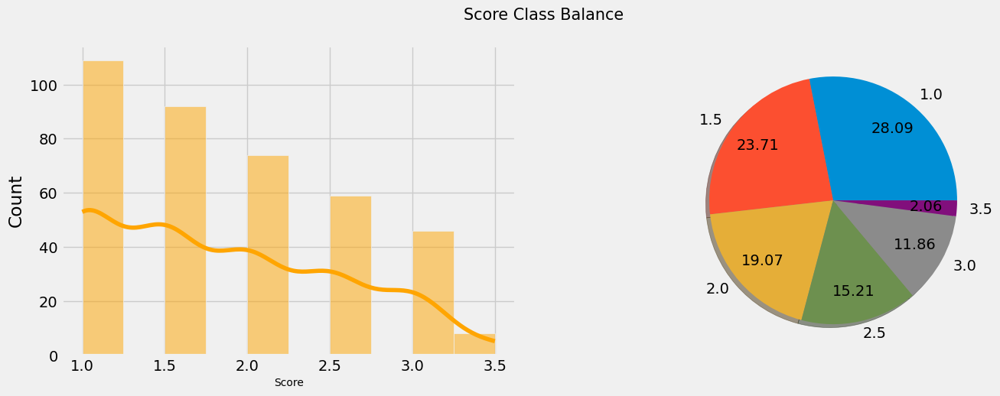

In [13]:
# Because we want to predict the Score of the pilling, let's check the Target Class Balance

plt.rcParams['figure.figsize'] = (15, 5)
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
sns.histplot(FullData['Score'],color="orange",kde=True)

plt.xlabel('Score', fontsize = 10)

plt.subplot(1, 2, 2)
FullData['Score'].value_counts().plot(kind = 'pie', autopct = '%.2f', startangle = 0,
                                     labels = ['1.0', '1.5', '2.0', '2.5', '3.0', '3.5'],
                                      shadow = True, pctdistance = 0.75)

plt.axis('off')

plt.suptitle('Score Class Balance', fontsize = 15)
plt.show()

We can easily see that the Score Class is highly imbalanced, and we can balance these classes of Score Class.
Most of the times, when we use Machine Learning model with imbalanced classes, we have a very poor results which are competely biased towards the class having higher distribution.

# Treatment of Missing Values

* Treatment of Missing Values is very Important Step in any Machine Learning Model Creation 
* Missing Values can be cause due to various reasons such as the filling incomplete forms, values not available, etc
* There are so many types of Missing Values such as 
     * Missing values at Random
     * Missing values at not Random
     * Missing Values at Completely Random
* What can we do to Impute or Treat Missing values to make a Good Machine Learning Model
    * We can use Business Logic to Impute the Missing Values
    * We can use Statistical Methods such as Mean, Median, and Mode.
    * We can use ML Techniques to impute the Missing values
    * We can delete the Missing values, when the Missing values percentage is very High.
    
* When to use Mean, and when to use Median?
    * We use Mean, when we do not have Outliers in the dataset for the Numerical Variables.
    * We use Median, when we have outliers in the dataset for the Numerical Variables.
    * We use Mode, When we have Categorical Variables.

In [14]:
# missing values in data set

# lets calculate the total missing values in the dataset
train_total = FullData.isnull().sum()

# lets calculate the percentage of missing values in the dataset
train_percent = ((FullData.isnull().sum()/FullData.shape[0])*100).round(2)

# # lets make a dataset consisting of total no. of missing values and percentage of missing values in the dataset
train_missing_data = pd.concat([train_total, train_percent],
                                axis=1, 
                                keys=['Total missing values', '% of missing values'],
                                sort = True)

# # lets check the head
train_missing_data.style.background_gradient(cmap = 'BuGn')

,Total missing values,% of missing values
Color,0,0.000000
Average Area of Protrusions,0,0.000000
Average Distance Between Protrusions,0,0.000000
Average Height of Protrusions,0,0.000000
Average Number of Protrusions,0,0.000000
Average Width of Protrusions,0,0.000000
Brightness,0,0.000000
Code,388,100.000000
Comp.,388,100.000000
Date,388,100.000000


We can see that few columns does not have data at all, which means we can drop these columns.
For now, let's replace all Nan in the table with 0

In [15]:
# Fill all nan with 0
FullData = FullData.fillna(0) 

# lets check whether the Null values are still present or not?
print("Number of Missing Values Left in the Data Set:", FullData.isnull().sum().sum())

Number of Missing Values Left in the Data Set: 0


# Feature Engineering

Feature engineering is the process of using domain knowledge to extract features from raw data via data mining techniques. These features can be used to improve the performance of machine learning algorithms. Feature engineering can be considered as applied machine learning itself.

* There are mutliple ways of performing feature engineering.
* So many people in the Industry consider it the most important step to improve the Model Performance.
* We should always understand the columns well to make some new features using the old existing features.
* Let's discuss the ways how we can perform feature engineering
    * We can perform Feature Engineering by Removing Unnecassary Columns
    * We can do it by Extracting Features from the Date and Time Features.
    * We can do it by Extracting Features from the Categorcial Features.
    * We can do it by Binnning the Numerical and Categorical Features.
    * We can do it by Aggregating Multiple Features together by using simple Arithmetic operations
    
* Here, we are only going to perform Feature Engineering by Aggregating some features together.

### Using only specific columns for our project
In the main case, there were many kind of fabrics, in our project, we try to predict only "pilling", so for that case, we are gonna use only the specific columns for our project. 

In [16]:
FullData = FullData[[' Color', 'Revol.', 'Direc','Score','Brightness','Shade','Average Number of Protrusions',
                     'Average Width of Protrusions','Average Height of Protrusions','Average Area of Protrusions',
                     'Average Distance Between Protrusions','Relative Brightness','Max Height','Full Area','Normalized Brightness']]

FullData

,Color,Revol.,Direc,Score,Brightness,Shade,Average Number of Protrusions,Average Width of Protrusions,Average Height of Protrusions,Average Area of Protrusions,Average Distance Between Protrusions,Relative Brightness,Max Height,Full Area,Normalized Brightness
2,brown D,100,W,3.5,17.00,2,0.85,2.31,0.83,1.18,0.13,0.60,1.05,1.48,20.54
3,brown D,100,L,3.5,17.95,2,0.95,1.99,0.88,0.96,0.31,0.61,1.03,1.12,20.59
4,brown D,100,L,3.5,17.60,2,1.10,1.78,1.01,1.02,0.42,0.65,1.24,1.26,18.30
5,brown D,100,W,3.5,16.60,2,0.45,1.83,0.82,0.89,0.22,0.67,1.03,1.06,21.08
8,orange M,100,L,2.5,24.15,3,1.30,1.88,0.91,1.03,0.55,0.65,1.18,1.27,18.96
9,orange M,100,W,3.0,22.20,3,1.05,2.31,0.91,1.23,0.32,0.62,1.11,1.51,19.19
10,orange M,100,L,2.5,22.95,3,0.70,2.31,0.88,1.15,0.22,0.65,1.05,1.38,20.02
11,orange M,100,W,3.0,22.60,3,1.05,1.67,0.88,0.86,0.42,0.66,1.12,1.04,19.08
14,orange M,300,L,2.0,25.10,3,0.80,2.17,1.06,1.26,0.26,0.65,1.30,1.56,17.22
15,orange M,300,W,2.5,23.05,3,1.25,2.00,0.98,1.09,0.45,0.64,1.20,1.31,19.78


The treatment of missing values is an important step in training machine learning models. Missing values result from various reasons such as incomplete forms, unavailable values, etc. Multiple methods have been suggested to compute missing values. They can be calculated using business logic or even deleted when their percentage is very high. The classical methods are to use mean, median, and mode. Mean is used for numerical variables when there are not many outliers in the dataset; median is used for numerical variables when there are outliers in the dataset; mode is used to treat categorical variables. In this research, we dropped some rows and columns with missing meaningless features such as: code/ID of the fabric, the date the image was taken, etc. 

# Outlier Detection

The presence of outliers in a classification or regression dataset can result in a poor fit and lower predictive modeling performance. Instead, automatic outlier detection methods can be used in the modeling pipeline and compared, just like other data preparation transforms that may be applied to the dataset.

In [17]:
# Lets first analyze the Numberical Columns
FullData.select_dtypes('number').head()

,Revol.,Score,Brightness,Shade,Average Number of Protrusions,Average Width of Protrusions,Average Height of Protrusions,Average Area of Protrusions,Average Distance Between Protrusions,Relative Brightness,Max Height,Full Area,Normalized Brightness
2,100,3.5,17.00,2,0.85,2.31,0.83,1.18,0.13,0.60,1.05,1.48,20.54
3,100,3.5,17.95,2,0.95,1.99,0.88,0.96,0.31,0.61,1.03,1.12,20.59
4,100,3.5,17.60,2,1.10,1.78,1.01,1.02,0.42,0.65,1.24,1.26,18.30
5,100,3.5,16.60,2,0.45,1.83,0.82,0.89,0.22,0.67,1.03,1.06,21.08
8,100,2.5,24.15,3,1.30,1.88,0.91,1.03,0.55,0.65,1.18,1.27,18.96


In [18]:
FullData['Score'] = np.where(FullData['Score'] > 2, 1, 0)

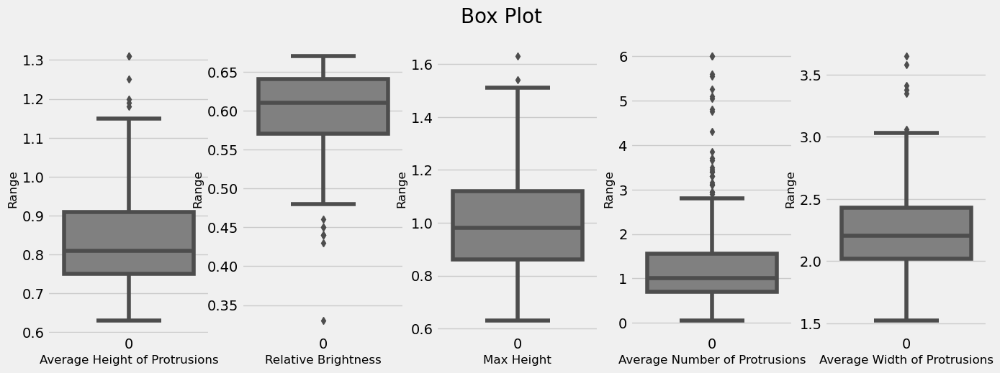

In [19]:
# lets check the boxplots for the columns where we suspect for outliers
plt.rcParams['figure.figsize'] = (15, 5)
plt.style.use('fivethirtyeight')

# Box plot for Height of Protrusiond
plt.subplot(1, 5, 1)
sns.boxplot(FullData['Average Height of Protrusions'].values, color = 'grey')
plt.xlabel('Average Height of Protrusions', fontsize = 12)
plt.ylabel('Range', fontsize = 12)

# Box plot for Relative Brightness
plt.subplot(1, 5, 2)
sns.boxplot(FullData['Relative Brightness'].values, color = 'grey')
plt.xlabel('Relative Brightness', fontsize = 12)
plt.ylabel('Range', fontsize = 12)

# Box plot for Max Height
plt.subplot(1, 5, 3)
sns.boxplot(FullData['Max Height'].values, color = 'grey')
plt.xlabel('Max Height', fontsize = 12)
plt.ylabel('Range', fontsize = 12)

# Box plot for Number of Protrusiond
plt.subplot(1, 5, 4)
sns.boxplot(FullData['Average Number of Protrusions'].values, color = 'grey')
plt.xlabel('Average Number of Protrusions', fontsize = 12)
plt.ylabel('Range', fontsize = 12)

# Box plot for Width of Protrusiond
plt.subplot(1, 5, 5)
sns.boxplot(FullData['Average Width of Protrusions'].values, color = 'grey')
plt.xlabel('Average Width of Protrusions', fontsize = 12)
plt.ylabel('Range', fontsize = 12)

plt.suptitle('Box Plot', fontsize = 20)
plt.show()

The box plots above help us to analyze the middle 50 percentile of the data, and we can clearly check the minimum, maximum, median, and thus identify the outlier values. Considering our relatively small dataset, despite identifying some outliers in our dataset, we have determined to keep them.

The presence of outliers in a classification or regression dataset can result in a poor fit and lower predictive modeling performance.

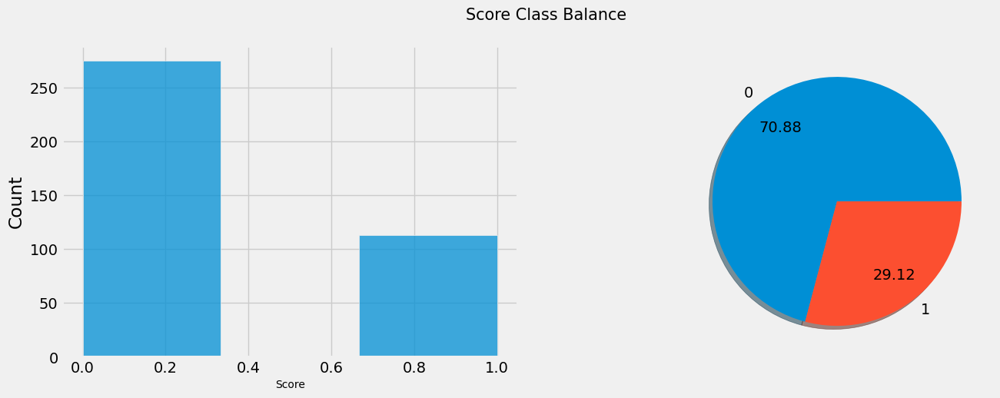

In [20]:
# Because we want to predict the Score of the pilling, let's check the Target Class Balance

plt.rcParams['figure.figsize'] = (15, 5)
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
sns.histplot(FullData['Score'],bins = 3)

plt.xlabel('Score', fontsize = 10)

plt.subplot(1, 2, 2)
FullData['Score'].value_counts().plot(kind = 'pie', autopct = '%.2f', startangle = 0,
                                     labels = ['0', '1'],
                                      shadow = True, pctdistance = 0.75)

plt.axis('off')

plt.suptitle('Score Class Balance', fontsize = 15)
plt.show()

# Univariate Analysis

Univariate analysis is perhaps the simplest form of statistical analysis. Like other forms of statistics, it can be inferential or descriptive. The key fact is that only one variable is involved. Univariate analysis can yield misleading results in cases in which multivariate analysis is more appropriate.

* This is an Essential step, to understand the variables present in the dataset one by one.
* First, we will check the Univariate Analysis for Numerical Columns to check for Outliers by using Box plots.
* Then, we will use Distribution plots to check the distribution of the Numerical Columns in the Dataset.
* After that we will check the Univariate Analysis for Categorical Columns using Pie charts, and Count plots.
* We Use Pie charts, when we have very few categories in the categorical column, and we use count plots we have more categorises in the dataset.

In [21]:
# Check the length unqiue values of each column
for column in list(FullData.columns):
    print(column,':' ,len(set(list(FullData[column]))))

 Color : 31
Revol. : 15
Direc : 2
Score : 2
Brightness : 288
Shade : 4
Average Number of Protrusions : 74
Average Width of Protrusions : 128
Average Height of Protrusions : 56
Average Area of Protrusions : 84
Average Distance Between Protrusions : 75
Relative Brightness : 25
Max Height : 75
Full Area : 98
Normalized Brightness : 328


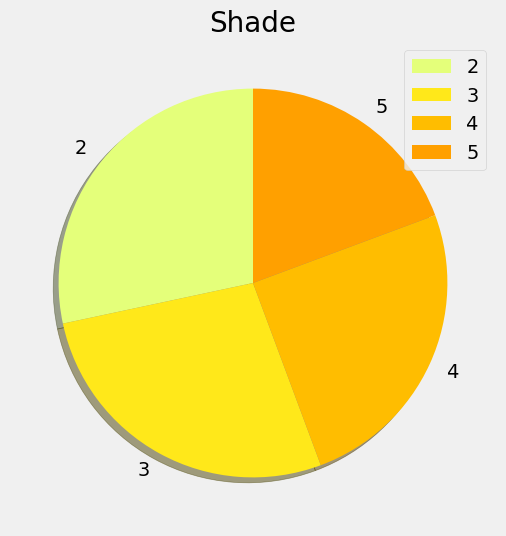

In [22]:
# lets plot pie chart for the columns where we have very few categories
plt.rcParams['figure.figsize'] = (20, 6)
plt.style.use('fivethirtyeight')

# plotting a pie chart to represent share of Shade column
plt.subplot(1, 1, 1)
labels = set(list(FullData['Shade']))
sizes = FullData['Shade'].value_counts()
colors = plt.cm.Wistia(np.linspace(0, 1, 5))
explode = [0, 0, 0, 0]

plt.pie(sizes, labels = labels, colors = colors, shadow = True, startangle = 90)
plt.title('Shade', fontsize = 20)


plt.legend()
plt.show()

From the pie chart we conclude that the distribution of the shade feature is close to uniform.

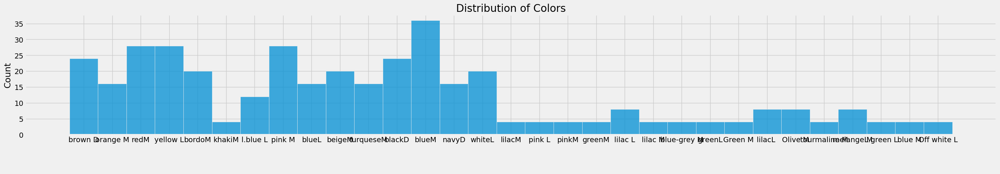

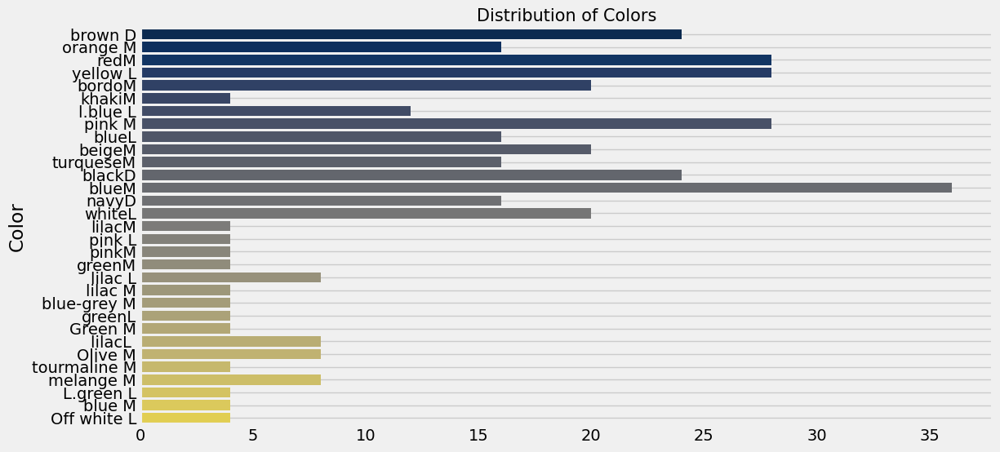

In [23]:
# lets check the distribution of Colors

plt.rcParams['figure.figsize'] = (30, 4)
sns.histplot(FullData[' Color'].values)
sns.color_palette('plasma')
plt.xlabel(' ', fontsize = 50)
plt.title('Distribution of Colors')
plt.show()

plt.rcParams['figure.figsize'] = (12, 6)
sns.countplot(y = FullData[' Color'].values, palette = 'cividis', orient = 'v')
plt.xlabel('')
plt.ylabel('Color')
plt.title('Distribution of Colors', fontsize = 15)
plt.grid()

plt.show()

In [24]:
# lets check the Brightness

px.histogram(FullData,x='Brightness',template='plotly_dark',title='Distribution of Brightness')

# Bivariate Analysis & Multivariate Analysis

Bivariate analysis is one of the simplest forms of quantitative analysis. It involves the analysis of two variables, for the purpose of determining the empirical relationship between them. Bivariate analysis can be helpful in testing simple hypotheses of association.

* Types of Bivariate Analysis
    * Categorical vs Categorical 
    * Categorical vs Numerical
    * Numerical vs Numerical
    
* First, we will perform Categorical vs Categorical Analysis using Stacked and Grouped Bar Charts with the help of crosstab function.
* Second, we will perform Categorical vs Numerical Analysis using Bar Charts, Box plots, Strip plots, Swarm plots, Boxen plots, Violin Plots, etc
* Atlast, we will perform Numerical vs Numerical Analysis using Scatter plots.

Multivariate analysis is based on the principles of multivariate statistics, which involves observation and analysis of more than one statistical outcome variable at a time.

* First, we will use the Correlation Heatmap to check the correlation between the Numerical Columns
* Then we will check the ppscore or the Predictive Score to check the correlation between all the columns present in the data.
* Then, we will use Bubble Charts, split Violin plots, Hue with Bivariate Plots.

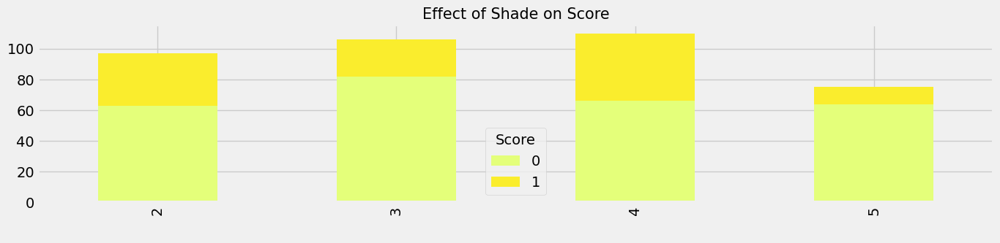

In [25]:
# Check the Effect of Shade on Score

import warnings
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (15, 3)
x = pd.crosstab(FullData['Shade'], FullData['Score'])
colors = plt.cm.Wistia(np.linspace(0, 1, 6))
x.plot(kind = 'bar', stacked = True, color = colors)
plt.title('Effect of Shade on Score', fontsize = 15)
plt.xlabel(' ')
plt.show()

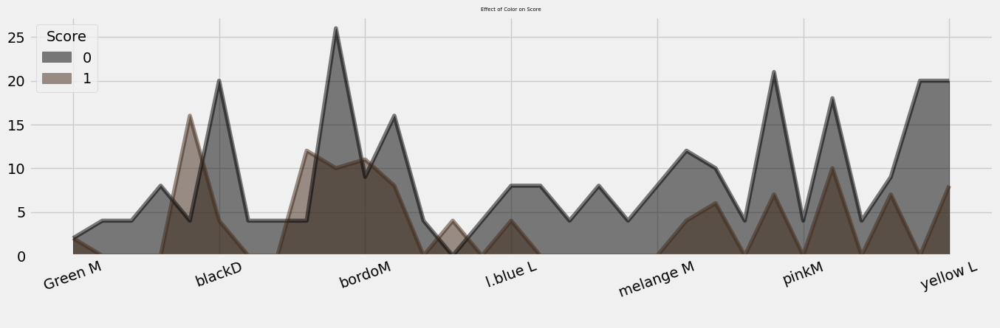

In [26]:
# lets compare the effect of different Colors on the Score

plt.rcParams['figure.figsize'] = (15,4)
x = pd.crosstab(FullData[' Color'], FullData['Score'])
colors = plt.cm.copper(np.linspace(0, 1, 6))
x.plot(kind = 'area', stacked = False, color = colors)
plt.title('Effect of Color on Score', fontsize = 5)
plt.xticks(rotation = 20)
plt.xlabel(' ')
plt.show()

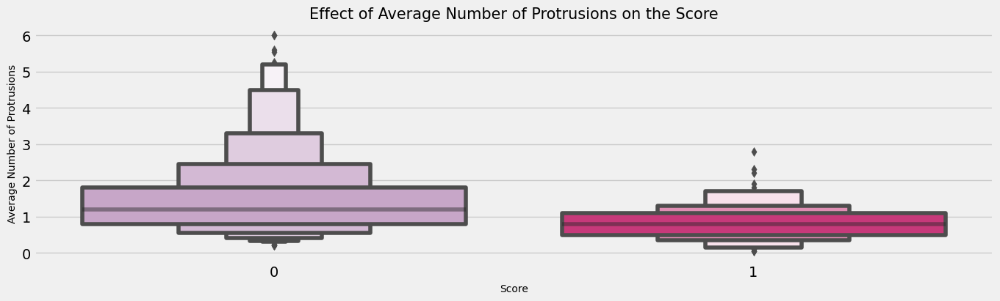

In [27]:
# Effect of Number of Protrusiond on the Score

plt.rcParams['figure.figsize'] = (15,4)
sns.boxenplot(x = FullData['Score'].values,y= FullData['Average Number of Protrusions'].values, palette = 'PuRd')
plt.title('Effect of Average Number of Protrusions on the Score', fontsize = 15)
plt.xlabel('Score', fontsize = 10)
plt.ylabel('Average Number of Protrusions', fontsize = 10)
plt.show()

We used bivariate analysis to check the relationship between features to the score. The above chart demonstrates that the smaller the number of protrusions in an image, the score tends to be a success (binary classification 1 in our case).

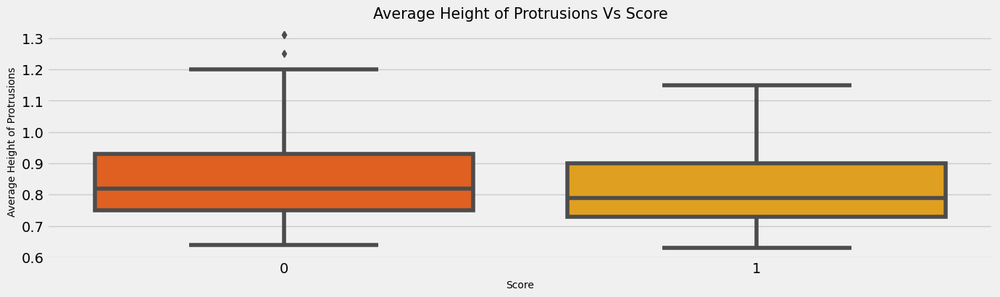

In [28]:
# Height of Protrusiond Vs Score

plt.rcParams['figure.figsize'] = (15, 4)
sns.boxplot(x=FullData['Score'], y=FullData['Average Height of Protrusions'], palette = 'autumn')
plt.title('Average Height of Protrusions Vs Score', fontsize = 15)
plt.ylabel('Average Height of Protrusions', fontsize = 10)
plt.xlabel('Score', fontsize = 10)
plt.show()

When analyzing the impact of protrusion height on the classification, we conclude that the higher the average height, the score tends to be a failure (binary classification 0 in our case). This is illustrated in Figure above.

# Multivariate Analysis

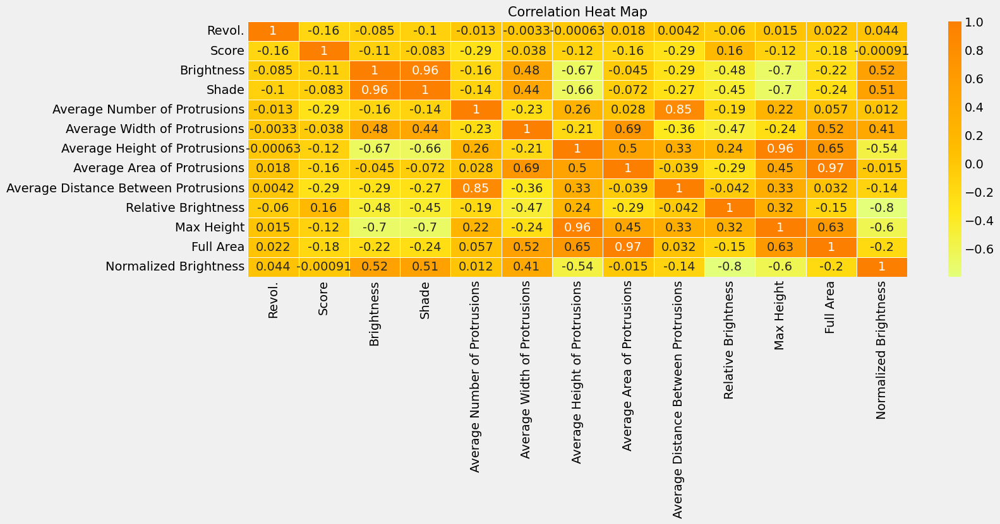

In [29]:
# lets check the Heat Map for the Data with respect to correlation.

plt.rcParams['figure.figsize'] = (15, 5)
sns.heatmap(FullData.corr(), annot = True, linewidth = 0.5, cmap = 'Wistia')
plt.title('Correlation Heat Map', fontsize = 15)
plt.show()

Multivariate analysis is based on the principles of multivariate statistics, which involves observation and analysis of more than one statistical outcome variable at a time.

* First, we will use the Correlation Heatmap to check the correlation between the Numerical Columns
* Then we will check the ppscore or the Predictive Score to check the correlation between all the columns present in the data.
* Then, we will use Bubble Charts, split Violin plots, Hue with Bivariate Plots.

Here, we can see some obvious results:
- Shade, and Brightness are Highly Correlated.
- Interval Between Protrusions, and Number of Protrusions are Highly Correlated.
- Also, it makes sense that Max Height & Height of Protrusions will be Highly Correlated.

In [30]:
# lets understand the impact of Max Height on Average Height of Protrusions
px.scatter(FullData, y = 'Average Height of Protrusions',
           x = 'Max Height',
           marginal_y = 'violin',
           trendline = 'ols')

In [31]:
# the impact of Average Distance Between Protrusions on Average Number of Protrusions
px.scatter(FullData, y = 'Average Number of Protrusions',
           x = 'Average Distance Between Protrusions',
           marginal_y = 'violin',
           trendline = 'ols')

In [32]:
# lets understand the impact of Shade on Brightness
px.scatter(FullData, y = 'Brightness',
           x = 'Shade',
           marginal_y = 'violin',
           trendline = 'ols')

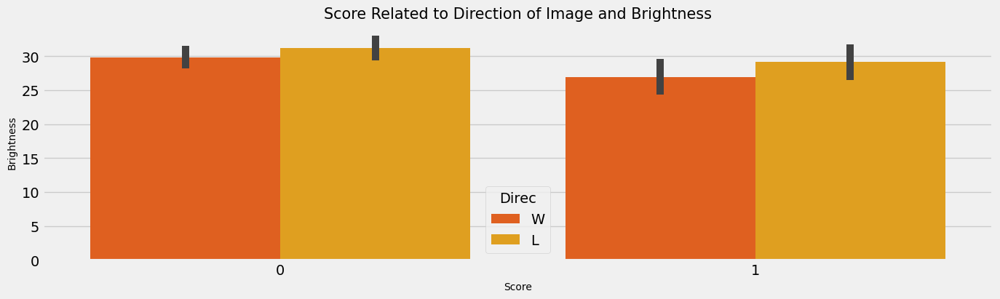

In [33]:
# lets check the relation of Brightness and Direction to the Score.

plt.rcParams['figure.figsize'] = (15, 4)
sns.barplot(x=FullData['Score'], y=FullData['Brightness'], hue = FullData['Direc'], palette = 'autumn')
plt.title('Score Related to Direction of Image and Brightness', fontsize = 15)
plt.ylabel('Brightness', fontsize = 10)
plt.xlabel('Score', fontsize = 10)
plt.show()

We can clearly see that all images has been taken from their length, had more brightness.

In [34]:
# A Bubble Chart to Represent the relation of Full Area with Average Area of Protrusions & Max Height.

px.scatter(FullData,
                 x="Full Area",
                 y="Average Area of Protrusions",
                 size="Max Height",
                 color="Full Area",
           hover_name="Max Height", size_max=15)

* This Chart makes it clear to see the correlation between Full Area & Area of Protrusiond.
* This chart makes it clear to see that there is a slight correlation between Full Area & Max Height (Size of the bubble).

# Dealing with Categorical Columns - OneHot Encoding

Categorical variables are known to hide and mask lots of interesting information in a data set. It’s crucial to learn the methods of dealing with such variables. If you won’t, many a times, you’d miss out on finding the most important variables in a model. It has happened with me. Initially, I used to focus more on numerical variables. Hence, never actually got an accurate model. But, later I discovered my flaws and learnt the art of dealing with such variables.

* There are various ways to encode categorical columns into Numerical columns
* This is an Essential Step, as we Machine Learning Models only works with Numerical Values.
* Here, we are going to use Business Logic to encode the education column
* Then we will use the Label Encoder, to Department and Gender Columns

In [35]:
# check the categorical columns present in the data
FullData.select_dtypes('object').head()

,Color,Direc
2,brown D,W
3,brown D,L
4,brown D,L
5,brown D,W
8,orange M,L


In [36]:
# check the value counts for the Color column
FullData[' Color'].value_counts()

blueM           36
pink M          28
redM            28
yellow L        28
brown D         24
blackD          24
beigeM          20
bordoM          20
whiteL          20
blueL           16
turqueseM       16
navyD           16
orange M        16
l.blue L        12
melange M        8
lilac L          8
Olive M          8
lilacL           8
blue M           4
Green M          4
L.green L        4
tourmaline M     4
lilacM           4
greenL           4
blue-grey M      4
lilac M          4
greenM           4
pinkM            4
pink L           4
khakiM           4
Off white L      4
Name:  Color, dtype: int64

In [37]:
# encoding these categorical columns to convert them into numerical columns

#Reset the index 
#FullData = FullData.reset_index()

# # Create an Index List
# ColorList = []    
# for i in range (1, len(set(FullData[' Color'])) + 1):
#     ColorList.append(i)
#     print(FullData[' Color'][i-1]," :" ,i)

# encode the Color 
# FullData[' Color'] = FullData[' Color'].replace((list(set(FullData[' Color']))),
#                                            ColorList)

dummies = pd.get_dummies(FullData[' Color'])
FullData = pd.concat([FullData, dummies], axis=1)

In [38]:
FullData.columns

Index([' Color', 'Revol.', 'Direc', 'Score', 'Brightness', 'Shade',
       'Average Number of Protrusions', 'Average Width of Protrusions',
       'Average Height of Protrusions', 'Average Area of Protrusions',
       'Average Distance Between Protrusions', 'Relative Brightness',
       'Max Height', 'Full Area', 'Normalized Brightness', 'Green M',
       'L.green L', 'Off white L', 'Olive M', 'beigeM', 'blackD', 'blue M',
       'blue-grey M', 'blueL', 'blueM', 'bordoM', 'brown D', 'greenL',
       'greenM', 'khakiM', 'l.blue L', 'lilac L', 'lilac M', 'lilacL ',
       'lilacM', 'melange M', 'navyD', 'orange M', 'pink L', 'pink M', 'pinkM',
       'redM', 'tourmaline M', 'turqueseM', 'whiteL', 'yellow L'],
      dtype='object')

In [39]:
# We Can also use Label Encoding for Color to convert them into Numerical,
# but we wan't to have a dicionary for ourselves so we can know what each number represent.

# use Label Encoding for Direction to convert them into Numerical,
le = LabelEncoder()
FullData['Direc'] = le.fit_transform(FullData['Direc'])

#FullData = FullData.drop(['index'], axis=1)

In [40]:
FullData.head(3)

,Color,Revol.,Direc,Score,Brightness,Shade,Average Number of Protrusions,Average Width of Protrusions,Average Height of Protrusions,Average Area of Protrusions,Average Distance Between Protrusions,Relative Brightness,Max Height,Full Area,Normalized Brightness,Green M,L.green L,Off white L,Olive M,beigeM,blackD,blue M,blue-grey M,blueL,blueM,bordoM,brown D,greenL,greenM,khakiM,l.blue L,lilac L,lilac M,lilacL,lilacM,melange M,navyD,orange M,pink L,pink M,pinkM,redM,tourmaline M,turqueseM,whiteL,yellow L
2,brown D,100,1,1,17.00,2,0.85,2.31,0.83,1.18,0.13,0.60,1.05,1.48,20.54,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,brown D,100,0,1,17.95,2,0.95,1.99,0.88,0.96,0.31,0.61,1.03,1.12,20.59,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,brown D,100,0,1,17.60,2,1.10,1.78,1.01,1.02,0.42,0.65,1.24,1.26,18.30,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [41]:
# lets check whether we still have any categorical columns left after encoding
print(FullData.select_dtypes('object').columns)

Index([' Color'], dtype='object')


In [42]:
FullData = FullData.drop([' Color'], axis = 1)

In [43]:
# lets check the data after encoding
FullData.head(3)

,Revol.,Direc,Score,Brightness,Shade,Average Number of Protrusions,Average Width of Protrusions,Average Height of Protrusions,Average Area of Protrusions,Average Distance Between Protrusions,Relative Brightness,Max Height,Full Area,Normalized Brightness,Green M,L.green L,Off white L,Olive M,beigeM,blackD,blue M,blue-grey M,blueL,blueM,bordoM,brown D,greenL,greenM,khakiM,l.blue L,lilac L,lilac M,lilacL,lilacM,melange M,navyD,orange M,pink L,pink M,pinkM,redM,tourmaline M,turqueseM,whiteL,yellow L
2,100,1,1,17.00,2,0.85,2.31,0.83,1.18,0.13,0.60,1.05,1.48,20.54,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,100,0,1,17.95,2,0.95,1.99,0.88,0.96,0.31,0.61,1.03,1.12,20.59,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,100,0,1,17.60,2,1.10,1.78,1.01,1.02,0.42,0.65,1.24,1.26,18.30,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [44]:
# import sklearn
# sklearn.utils.shuffle(FullData)

# Splitting the Data

This is one of the most Important step to perform Machine Learning Prediction on a Dataset,
We have to separate the Target and Independent Columns.
* We store the Target Variable in y, and then we store athe rest of the columns in x, by deleting the target column from the data
* Also, we are changing the name of test dataset to x_test for ease of understanding.

In [45]:
# lets split the target data from the FullData

y = FullData['Score']
x = FullData.drop(['Score'], axis = 1)

# lets print the shapes of these newly formed data sets
print("Shape of the x :", x.shape)
print("Shape of the y :", y.shape)

Shape of the x : (388, 44)
Shape of the y : (388,)


# Resampling

Resampling is the method that consists of drawing repeated samples from the original data samples. The method of Resampling is a nonparametric method of statistical inference.

* Earlier, in this Problem we noticed that the Target column is Highly Imbalanced, we need to balance the data by using some Statistical Methods.
* There are many Statistical Methods we can use for Resampling the Data such as:
    * Over Samping
    * Cluster based Sampling
    * Under Sampling.
    
Oversampling and undersampling in data analysis are techniques used to adjust the class distribution of a data set. These terms are used both in statistical sampling, survey design methodology and in machine learning. Oversampling and undersampling are opposite and roughly equivalent techniques
    
* We are going to use Over Sampling. 
* We will not use Under Sampling to avoid data loss.

In [46]:
#Encoding

lab_enc = preprocessing.LabelEncoder()
FullData['Score'] = lab_enc.fit_transform(FullData['Score'])

print(utils.multiclass.type_of_target(FullData['Score']))
print(utils.multiclass.type_of_target(FullData['Score'].astype('str')))

# It is very important to resample the data, as the Target class is Highly imbalanced.
# Here We are going to use Over Sampling Technique to resample the data.
# lets import the SMOTE algorithm to do the same.

# We need to change the type of data for column score, so it will not be continuous

x_resample, y_resample  = SMOTE().fit_resample(x, FullData['Score'].values.ravel())

# lets print the shape of x and y after resampling it
print(x_resample.shape)
print(y_resample.shape)

binary
binary
(550, 44)
(550,)


In [47]:
# lets also check the value counts of our target variable

print("Before Resampling :")
print(y.value_counts())

print("After Resampling :")
y_resample = pd.DataFrame(y_resample)
print(y_resample[0].value_counts())

Before Resampling :
0    275
1    113
Name: Score, dtype: int64
After Resampling :
1    275
0    275
Name: 0, dtype: int64


In [48]:
# lets create a validation set from the training data so that we can check whether the model that we have created is good enough
# lets import the train_test_split library from sklearn to do that

x_train, x_test, y_train, y_test = train_test_split(x_resample, y_resample, test_size = 0.1, random_state = 19)

# lets print the shapes again 
print("Shape of the x Train :", x_train.shape)
print("Shape of the y Train :", y_train.shape)
print("Shape of the x Valid :", x_test.shape)
print("Shape of the y Valid :", y_test.shape)

Shape of the x Train : (495, 44)
Shape of the y Train : (495, 1)
Shape of the x Valid : (55, 44)
Shape of the y Valid : (55, 1)


Imbalanced Data (Resampling)

As we have seen, our dataset, and in particular the target column, is imbalanced. To balance the dataset, we have applied the resampling method by adding records to the minority class or deleting records from the majority class [28]. Oversampling and under-sampling are opposite and roughly equivalent techniques. To avoid data loss, we have used oversampling. We used a SMOTE oversampling technique. The algorithm is as follows:
for each pattern in X_0 from the minority class: 
* (1) Pick one of its K nearest neighbors X (belonging to the minority class also); 
* (2) Create a new pattern Z on a random point on the line segment connecting the pattern and the selected neighbor as follows: z=x_0+w(x-x_0 )


# Feature Scaling

Feature scaling is a method used to normalize the range of independent variables or features of data. In data processing, it is also known as data normalization and is generally performed during the data preprocessing step.
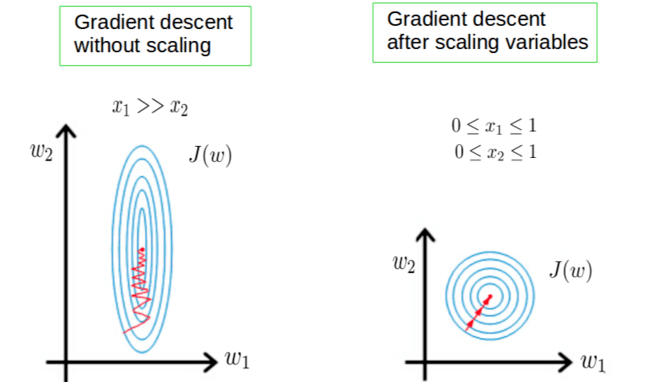


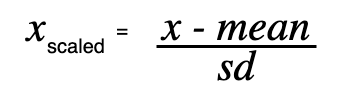

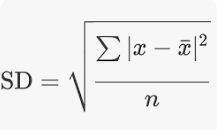

Feature scaling of the dataset is performed to change the feature vector into the format that is more suitable for machine learning algorithms. There are many scalers approaches for feature scaling, most used ones are Standard Scaler, Min Max Scaler, Normalizer, and Robust Scaler. Our dataset contains variables of different scales. Therefore, we used the Standard Scaler methodology, which transforms the dataset such that the resulting distribution mean value is zero and the standard deviation is one. The transformed value is obtained by subtracting mean value from the original value and dividing by the standard deviation.

In [49]:
# It is very import to scale all the features of the dataset into the same scale
# Here, we are going to use the standardization method, which is very commonly used.

sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

# Machine Learning Modelling

Predictive modeling is a process that uses data and statistics to predict outcomes with data models. These models can be used to predict anything from sports outcomes and TV ratings to technological advances and corporate earnings. Predictive modeling is also often referred to as: Predictive analytics.

# Decision Tree Classifier

A decision tree is a decision support tool that uses a tree-like model of decisions and their possible consequences, including chance event outcomes, resource costs, and utility. It is one way to display an algorithm that only contains conditional control statements.
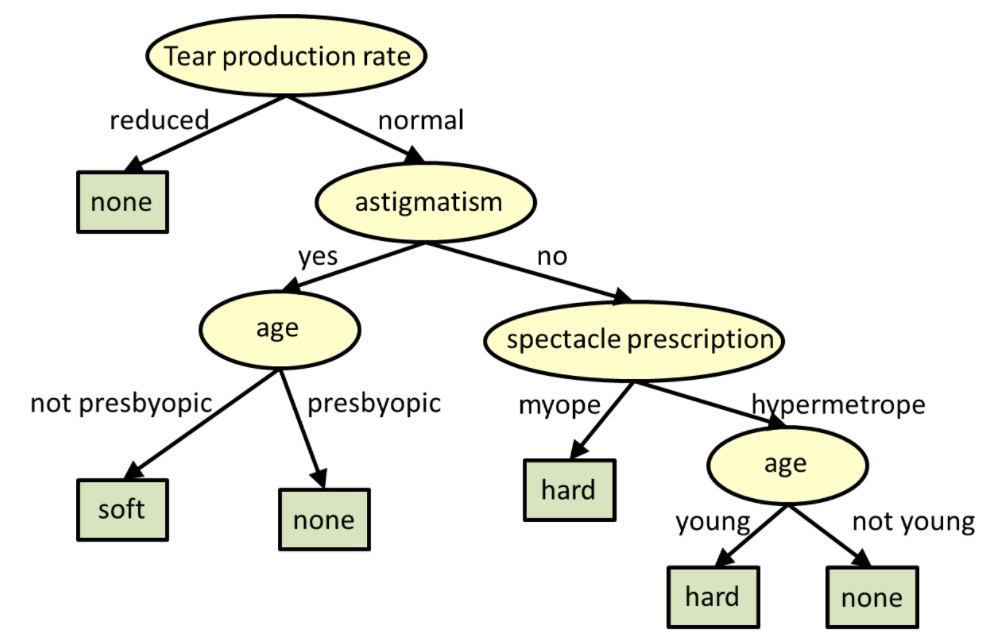

Training Accuracy : 0.9939393939393939
Testing Accuracy : 0.7090909090909091


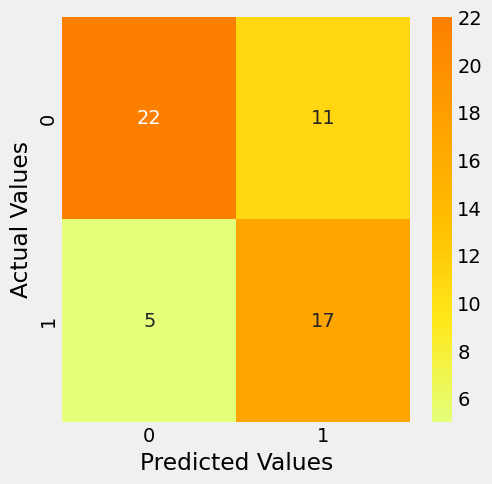

              precision    recall  f1-score   support

           0       0.81      0.67      0.73        33
           1       0.61      0.77      0.68        22

    accuracy                           0.71        55
   macro avg       0.71      0.72      0.71        55
weighted avg       0.73      0.71      0.71        55



In [50]:
# Lets use Decision Trees to classify the data

DecisionTree = DecisionTreeClassifier(max_depth=13)
DecisionTree.fit(x_train, y_train)

y_pred = DecisionTree.predict(x_test)

print("Training Accuracy :", DecisionTree.score(x_train, y_train))
print("Testing Accuracy :", DecisionTree.score(x_test, y_test))

cm = confusion_matrix(y_test, y_pred)
plt.rcParams['figure.figsize'] = (5, 5)
sns.heatmap(cm, annot = True, cmap = 'Wistia', fmt = '.8g')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

# lets take a look at the Classification Report

cr = classification_report(y_test, y_pred)
print(cr)

Obviously that the model above is overfitted, below we will show how to evaluate a model without overfitting the model.

>1, train: 0.667, test: 0.473
>2, train: 0.729, test: 0.564
>3, train: 0.772, test: 0.545
>4, train: 0.820, test: 0.582
>5, train: 0.881, test: 0.691
>6, train: 0.919, test: 0.673
>7, train: 0.945, test: 0.673
>8, train: 0.960, test: 0.691
>9, train: 0.968, test: 0.727
>10, train: 0.984, test: 0.709
>11, train: 0.984, test: 0.691
>12, train: 0.994, test: 0.709
>13, train: 0.992, test: 0.691
>14, train: 0.996, test: 0.691
>15, train: 1.000, test: 0.727
>16, train: 1.000, test: 0.691
>17, train: 1.000, test: 0.709
>18, train: 1.000, test: 0.673
>19, train: 1.000, test: 0.709
>20, train: 1.000, test: 0.709
>21, train: 1.000, test: 0.709
>22, train: 1.000, test: 0.709
>23, train: 1.000, test: 0.691
>24, train: 1.000, test: 0.709
>25, train: 1.000, test: 0.709
>26, train: 1.000, test: 0.709
>27, train: 1.000, test: 0.709
>28, train: 1.000, test: 0.709
>29, train: 1.000, test: 0.709


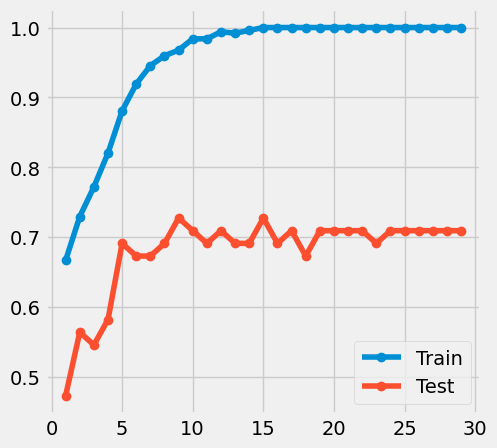

In [51]:
# evaluate a decision tree for each depth
train_scores = []
test_scores = []
values = [i for i in range(1, 30)]
for i in values:
    # configure the model
    model = DecisionTreeClassifier(max_depth=i)
    # fit model on the training dataset
    model.fit(x_train, y_train)
    # evaluate on the train dataset
    train_yhat = model.predict(x_train)
    train_acc = accuracy_score(y_train, train_yhat)
    train_scores.append(train_acc)
    # evaluate on the test dataset
    test_yhat = model.predict(x_test)
    test_acc = accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
    # summarize progress
    print('>%d, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
    
pyplot.plot(values, train_scores, '-o', label='Train')
pyplot.plot(values, test_scores, '-o', label='Test')
pyplot.legend()
pyplot.show()

In this case, we can see a trend of increasing accuracy on the training dataset with the tree depth to a point around a depth of 12-15 levels where the tree fits the training dataset perfectly.

We can also see that the accuracy on the test set improves with tree depth until a depth of about 12 to 15 levels, after which accuracy begins to get worse/slightly better with each increase in tree depth.

This is exactly what we would expect to see in a pattern of overfitting.

We would choose a tree depth of 12 to 15 before the model begins to overfit the training dataset.

# Bagging Classifier

A Bagging classifier is an ensemble meta-estimator that fits base classifiers each on random subsets of the original dataset and then aggregate their individual predictions (either by voting or by averaging) to form a final prediction. Such a meta-estimator can typically be used as a way to reduce the variance of a black-box estimator (e.g., a decision tree), by introducing randomization into its construction procedure and then making an ensemble out of it.
Each base classifier is trained in parallel with a training set which is generated by randomly drawing, with replacement, N examples(or data) from the original training dataset – where N is the size of the original training set. Training set for each of the base classifiers is independent of each other. Many of the original data may be repeated in the resulting training set while others may be left out.

Bagging reduces overfitting (variance) by averaging or voting, however, this leads to an increase in bias, which is compensated by the reduction in variance though.

How Bagging works on training dataset ?
How bagging works on an imaginary training dataset is shown below. Since Bagging resamples the original training dataset with replacement, some instance(or data) may be present multiple times while others are left out.

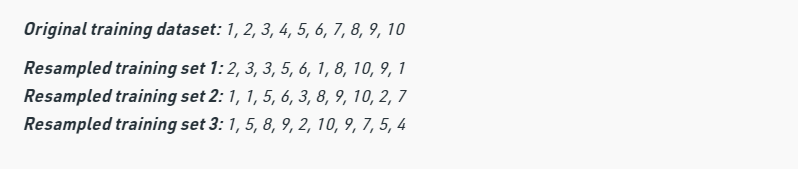

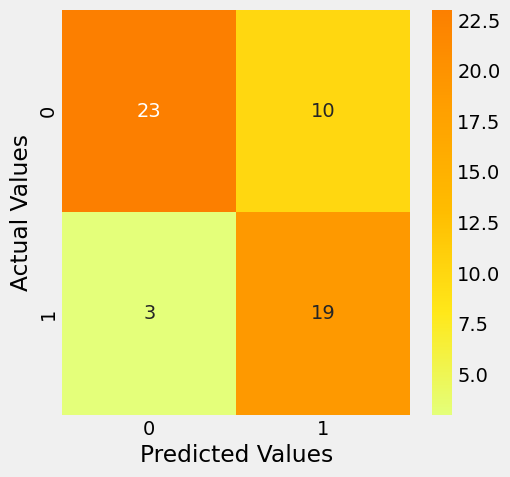

Training Accuracy : 1.0
Testing Accuracy : 0.7636363636363637
              precision    recall  f1-score   support

           0       0.88      0.70      0.78        33
           1       0.66      0.86      0.75        22

    accuracy                           0.76        55
   macro avg       0.77      0.78      0.76        55
weighted avg       0.79      0.76      0.77        55



In [52]:
bag_tree = BaggingClassifier(
            base_estimator=DecisionTreeClassifier(),
            n_estimators = 100,
            max_samples = 0.8,
            oob_score = True,
            random_state=0
)
bag_tree.fit(x_train, y_train)
y_pred = bag_tree.predict(x_test)

cm = confusion_matrix(y_test, y_pred)
plt.rcParams['figure.figsize'] = (5, 5)
sns.heatmap(cm, annot = True, cmap = 'Wistia', fmt = '.8g')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

print("Training Accuracy :", bag_tree.score(x_train, y_train))
print("Testing Accuracy :", bag_tree.score(x_test, y_test))
cr = classification_report(y_test, y_pred)
print(cr)

## Real Time Predictions For Bagging DecisionTreeClassifier 

In [53]:
print("Value of the first element in the test set is :",x_test[0])
print("What our model Predicted :", y_pred[0])

Value of the first element in the test set is : [10.86661742 -0.81649658 -1.16898808 -1.25271796 -0.59534651 -0.7338449
 -0.41818355 -0.35816061 -0.70963479 -0.84226006 -0.42856223 -0.2717606
  0.11206318 -0.10101525 -0.09025874 -0.09025874 -0.12816827 -0.24019223
 -0.21566555 -0.09025874 -0.09025874 -0.21566555  3.24216408 -0.22573306
 -0.25847697 -0.09025874 -0.10101525 -0.09025874 -0.16422836 -0.11076976
 -0.09025874 -0.12816827 -0.06369298 -0.11976753 -0.18276466 -0.19425717
 -0.09025874 -0.25847697 -0.07808688 -0.26289631 -0.07808688 -0.19425717
 -0.18276466 -0.24486154]
What our model Predicted : 0


In [54]:
print("The score of our results :", bag_tree.predict(np.array([[10.40491291, -0.83989663, -1.22341159, -1.28617873, -0.57141622,
       -0.78931712, -0.36261004, -0.39140869, -0.66306897, -0.80005435,
       -0.36883308, -0.28817738,  0.05423297, -0.09578263, -0.09578263,
       -0.09578263, -0.12714669, -0.27050089, -0.22387347, -0.09578263,
       -0.09578263, -0.21821789,  3.30028664, -0.21243974, -0.23485288,
       -0.08285523, -0.11757927, -0.09578263, -0.17448486, -0.11757927,
       -0.08285523, -0.13608276, -0.06757374, -0.12714669, -0.18128389,
       -0.17448486, -0.08285523, -0.26563059, -0.06757374, -0.25060314,
       -0.08285523, -0.18786729, -0.19425717, -0.23485288
                                     ]])))

The score of our results : [0]


# Predictive Modelling Logistic Regression

Training Accuracy : 0.9191919191919192
Testing Accuracy : 0.7272727272727273


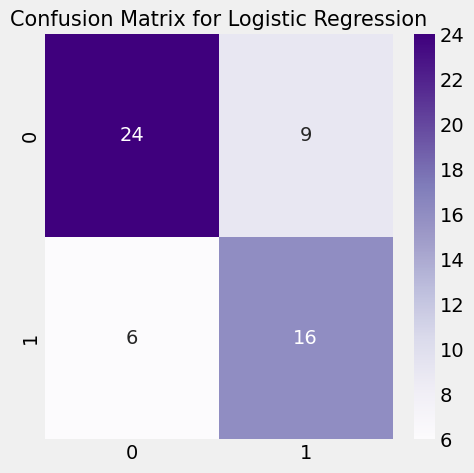

              precision    recall  f1-score   support

           0       0.80      0.73      0.76        33
           1       0.64      0.73      0.68        22

    accuracy                           0.73        55
   macro avg       0.72      0.73      0.72        55
weighted avg       0.74      0.73      0.73        55



In [55]:
# Create a Predictive Model works better with binary score label

Logistic = LogisticRegression()
Logistic.fit(x_train, y_train)
y_pred = Logistic.predict(x_test)
print("Training Accuracy :", Logistic.score(x_train, y_train))
print("Testing Accuracy :", Logistic.score(x_test, y_test))

# Confusion matrix
plt.rcParams['figure.figsize'] = (5, 5)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot = True, cmap = 'Purples')
plt.title('Confusion Matrix for Logistic Regression', fontsize = 15)
plt.show()

# Classification Report
cr = classification_report(y_test, y_pred)
print(cr)

>1, train: 0.885, test: 0.691
>2, train: 0.889, test: 0.709
>3, train: 0.899, test: 0.727
>4, train: 0.905, test: 0.745
>5, train: 0.905, test: 0.745
>6, train: 0.915, test: 0.745
>7, train: 0.907, test: 0.709
>8, train: 0.911, test: 0.727
>9, train: 0.909, test: 0.727
>10, train: 0.907, test: 0.727
>11, train: 0.905, test: 0.727
>12, train: 0.907, test: 0.727
>13, train: 0.911, test: 0.727
>14, train: 0.907, test: 0.727
>15, train: 0.905, test: 0.727
>16, train: 0.905, test: 0.727
>17, train: 0.911, test: 0.727
>18, train: 0.913, test: 0.727
>19, train: 0.909, test: 0.727
>20, train: 0.911, test: 0.727
>21, train: 0.909, test: 0.727
>22, train: 0.911, test: 0.727
>23, train: 0.911, test: 0.727
>24, train: 0.909, test: 0.727
>25, train: 0.911, test: 0.727
>26, train: 0.909, test: 0.727
>27, train: 0.909, test: 0.727
>28, train: 0.909, test: 0.727
>29, train: 0.909, test: 0.727
>30, train: 0.911, test: 0.727
>31, train: 0.909, test: 0.727
>32, train: 0.909, test: 0.727
>33, train: 0.907

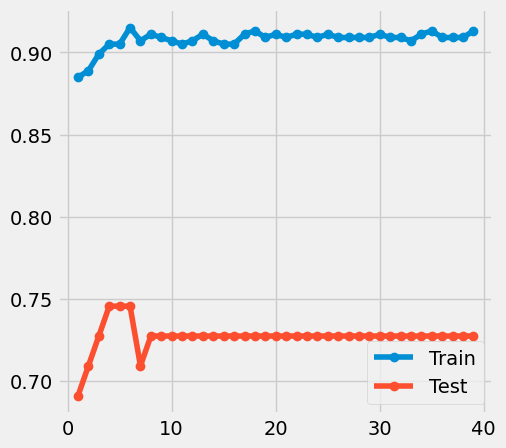

In [56]:
# evaluate a bagging classifier with logistic regression base for each estimator
train_scores = []
test_scores = []
values = [i for i in range(1, 40)]
for i in values:
    # configure the model
    model = BaggingClassifier(
            base_estimator=LogisticRegression(),
            n_estimators = i,
            max_samples = 0.8,
            oob_score = True,
            random_state=0)
    # fit model on the training dataset
    model.fit(x_train, y_train)
    # evaluate on the train dataset
    train_yhat = model.predict(x_train)
    train_acc = accuracy_score(y_train, train_yhat)
    train_scores.append(train_acc)
    # evaluate on the test dataset
    test_yhat = model.predict(x_test)
    test_acc = accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
    # summarize progress
    print('>%d, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
    
# Plot for ada boosting for logistic regression
pyplot.plot(values, train_scores, '-o', label='Train')
pyplot.plot(values, test_scores, '-o', label='Test')
pyplot.legend()
pyplot.show()

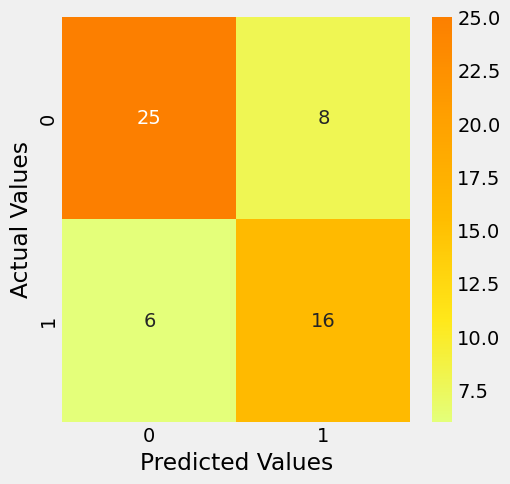

Training Accuracy : 0.9151515151515152
Testing Accuracy : 0.7454545454545455


In [57]:
#Bagging for Logistic Regression
bag_model_logistic = BaggingClassifier(
            base_estimator=LogisticRegression(),
            n_estimators = 6,
            max_samples = 0.8,
            oob_score = True,
            random_state=0
)
bag_model_logistic.fit(x_train, y_train)
y_pred = bag_model_logistic.predict(x_test)

cm = confusion_matrix(y_test, y_pred)
plt.rcParams['figure.figsize'] = (5, 5)
sns.heatmap(cm, annot = True, cmap = 'Wistia', fmt = '.8g')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

print("Training Accuracy :", bag_model_logistic.score(x_train, y_train))
print("Testing Accuracy :", bag_model_logistic.score(x_test, y_test))

# Ada Boost

AdaBoost is short for Adaptive Boosting is a way to combine many weak learners to make a strong learner. Weak learner is a learning algorithm that performs consistently better than random guessing. AdaBoost combines many such learners to form a hypothesis that gives arbitrarily high accuracy. The AdaBoost algorithm is adaptive, which means that it learns from its mistakes.

##### How AdaBoost works for binary classification tasks:

Given a training set, AdaBoost learns a simple and weak classifier in its first iteration. It notes the examples that this weak classifier incorrectly classifies and increases their weight for the next iteration. In the next iteration, it agains learns a new weak classifier that considers the increased weights of the previously incorrectly classified examples. Now we have 2 weak classifiers. 

The algorithm again notes the incorrectly classified examples by the second classifier and increases their weights for the next iteration and so on till it gets multiple classifiers.

A weighted sum of all these classifiers gives the final boosted classifier. The weights are a function of the accuracy of each classifier.

Modifying weights:
AdaBoost requires a learning algorithm that can account for weighted input examples i.e. the loss function should give more importance to examples with higher weights. 

In case we have an algorithm that does not support weighted inputs, we can use sampling. At every iteration, a classifier is learnt on a sampled training data. The training data is sampled according to a probability distribution that mimics the weight distribution. Samples with higher weight are repeated in the sampled set. If the weights are normalized i.e if they sum to 1, the weight distribution can be used as the probability distribution for sampling.

Pseudo Algorithm

Consider the input training set -

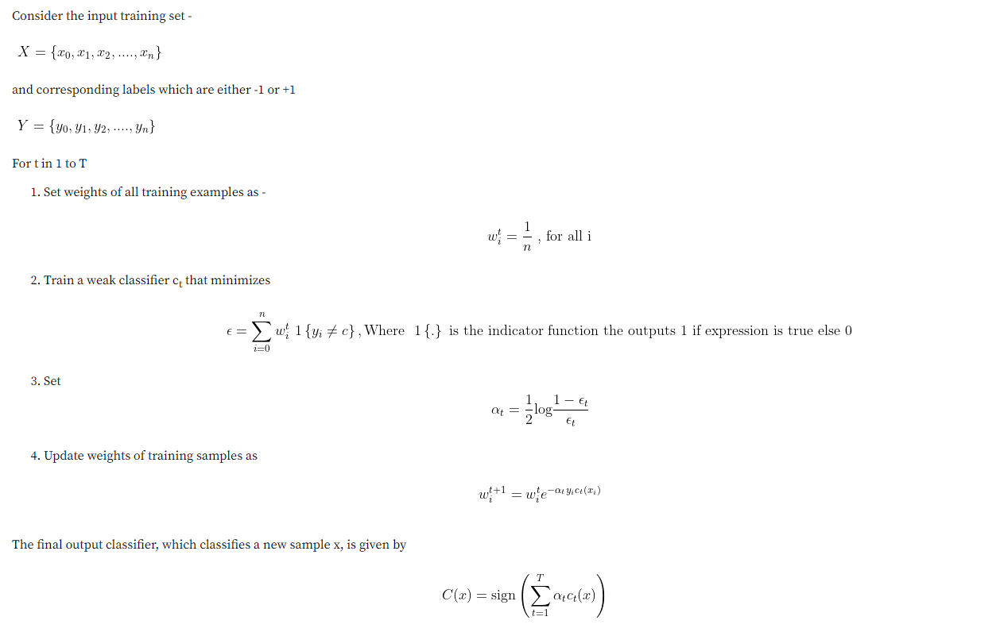

In [58]:
#Ada Model
AdaModel = AdaBoostClassifier(n_estimators = 40, learning_rate = 1)

AdaModel.fit(x_train, y_train)

y_pred = AdaModel.predict(x_test)

print("Training Accuracy :", AdaModel.score(x_train, y_train))
print("Testing Accuracy :", AdaModel.score(x_test, y_test))

Training Accuracy : 0.9191919191919192
Testing Accuracy : 0.6909090909090909


>0.020000, train: 0.832, test: 0.600
>0.036441, train: 0.840, test: 0.600
>0.052881, train: 0.846, test: 0.618
>0.069322, train: 0.846, test: 0.618
>0.085763, train: 0.844, test: 0.655
>0.102203, train: 0.844, test: 0.673
>0.118644, train: 0.844, test: 0.673
>0.135085, train: 0.848, test: 0.691
>0.151525, train: 0.848, test: 0.709
>0.167966, train: 0.844, test: 0.709
>0.184407, train: 0.846, test: 0.709
>0.200847, train: 0.846, test: 0.727
>0.217288, train: 0.848, test: 0.727
>0.233729, train: 0.851, test: 0.727
>0.250169, train: 0.855, test: 0.745
>0.266610, train: 0.855, test: 0.745
>0.283051, train: 0.857, test: 0.745
>0.299492, train: 0.857, test: 0.745
>0.315932, train: 0.857, test: 0.727
>0.332373, train: 0.857, test: 0.727
>0.348814, train: 0.859, test: 0.727
>0.365254, train: 0.859, test: 0.709
>0.381695, train: 0.859, test: 0.709
>0.398136, train: 0.859, test: 0.709
>0.414576, train: 0.861, test: 0.709
>0.431017, train: 0.861, test: 0.709
>0.447458, train: 0.861, test: 0.709
>

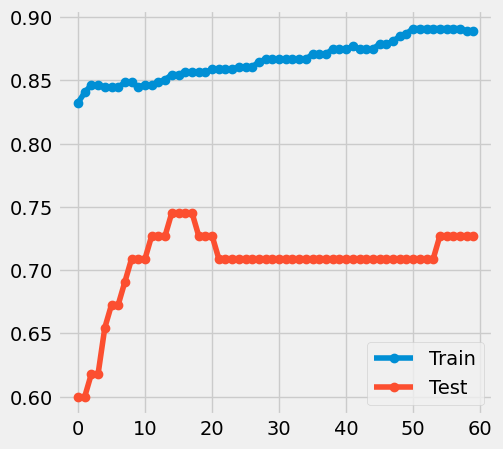

In [59]:
# evaluate a decision tree for each depth
train_scores = []
test_scores = []
values = [i for i in range(0, 60)]
s = list(np.linspace(0.02, 0.99, 60))

for i in s:
    # configure the model
    model = AdaBoostClassifier(n_estimators = 40,base_estimator = LogisticRegression() ,learning_rate = i)
    # fit model on the training dataset
    model.fit(x_train, y_train)
    # evaluate on the train dataset
    train_yhat = model.predict(x_train)
    train_acc = accuracy_score(y_train, train_yhat)
    train_scores.append(train_acc)
    # evaluate on the test dataset
    test_yhat = model.predict(x_test)
    test_acc = accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
    # summarize progress
    print('>%f, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
    
# Plot for ada boosting for logistic regression
pyplot.plot(values, train_scores, '-o', label='Train')
pyplot.plot(values, test_scores, '-o', label='Test')
pyplot.legend()
pyplot.show()

Training Accuracy : 0.8585858585858586
Testing Accuracy : 0.7090909090909091


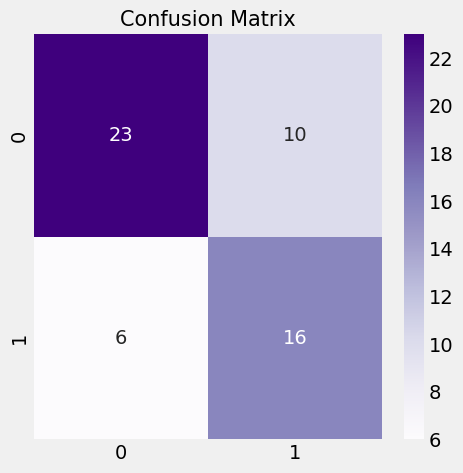

              precision    recall  f1-score   support

           0       0.79      0.70      0.74        33
           1       0.62      0.73      0.67        22

    accuracy                           0.71        55
   macro avg       0.70      0.71      0.70        55
weighted avg       0.72      0.71      0.71        55



In [60]:
model = AdaBoostClassifier(n_estimators = 40,base_estimator = LogisticRegression() ,learning_rate = 0.40)
model.fit(x_train, y_train)
y_pred = model.predict(x_test)
print("Training Accuracy :", model.score(x_train, y_train))
print("Testing Accuracy :", model.score(x_test, y_test))

# Confusion matrix
plt.rcParams['figure.figsize'] = (5, 5)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot = True, cmap = 'Purples')
plt.title('Confusion Matrix', fontsize = 15)
plt.show()

# Classification Report
cr = classification_report(y_test, y_pred)
print(cr)

# Random Forest

>1, train: 0.931, test: 0.709
>2, train: 0.925, test: 0.673
>3, train: 0.966, test: 0.691
>4, train: 0.964, test: 0.727
>5, train: 0.978, test: 0.745
>6, train: 0.978, test: 0.764
>7, train: 0.984, test: 0.745
>8, train: 0.984, test: 0.745
>9, train: 0.992, test: 0.764
>10, train: 0.990, test: 0.782
>11, train: 0.998, test: 0.764
>12, train: 0.996, test: 0.745
>13, train: 0.998, test: 0.745
>14, train: 0.998, test: 0.782
>15, train: 0.998, test: 0.764
>16, train: 0.998, test: 0.800
>17, train: 1.000, test: 0.782
>18, train: 1.000, test: 0.800
>19, train: 1.000, test: 0.782
>20, train: 0.998, test: 0.782
>21, train: 0.998, test: 0.782
>22, train: 0.998, test: 0.782
>23, train: 1.000, test: 0.782
>24, train: 1.000, test: 0.800
>25, train: 1.000, test: 0.782
>26, train: 1.000, test: 0.818
>27, train: 1.000, test: 0.818
>28, train: 1.000, test: 0.818
>29, train: 1.000, test: 0.818
>30, train: 1.000, test: 0.818
>31, train: 1.000, test: 0.800
>32, train: 1.000, test: 0.800
>33, train: 1.000

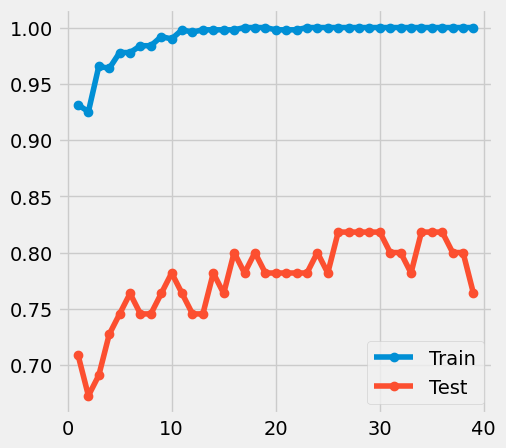

In [61]:
# evaluate a decision tree for each depth
train_scores = []
test_scores = []
values = [i for i in range(1, 40)]
for i in values:
    # configure the model
    model = RandomForestClassifier(n_estimators = i,
    criterion='gini',
    max_depth=None,
    max_features='sqrt',
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    bootstrap=True,
    max_samples=None,
    oob_score = True, 
    random_state=0)
    # fit model on the training dataset
    model.fit(x_train, y_train)
    # evaluate on the train dataset
    train_yhat = model.predict(x_train)
    train_acc = accuracy_score(y_train, train_yhat)
    train_scores.append(train_acc)
    # evaluate on the test dataset
    test_yhat = model.predict(x_test)
    test_acc = accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
    # summarize progress
    print('>%d, train: %.3f, test: %.3f' % (i, train_acc, test_acc))
    
# Plot for ada boosting for logistic regression
pyplot.plot(values, train_scores, '-o', label='Train')
pyplot.plot(values, test_scores, '-o', label='Test')
pyplot.legend()
pyplot.show()

Training Accuracy : 0.9777777777777777
Testing Accuracy : 0.7454545454545455
Out of Bag Score : 0.7494949494949495


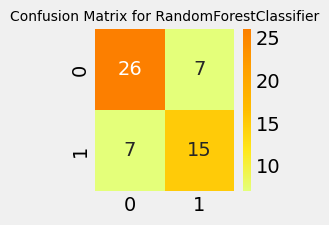

              precision    recall  f1-score   support

           0       0.79      0.79      0.79        33
           1       0.68      0.68      0.68        22

    accuracy                           0.75        55
   macro avg       0.73      0.73      0.73        55
weighted avg       0.75      0.75      0.75        55

Accuracy: 0.820 (0.033)


In [62]:
# Random Forest Model
RandomForest = RandomForestClassifier(n_estimators = 5,
    criterion='gini',
    max_depth=None,
    max_features='sqrt',
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    bootstrap=True,
    max_samples=None,
    oob_score = True,
    random_state=0)
RandomForest.fit(x_train, y_train)

y_pred2 = RandomForest.predict(x_test)

print("Training Accuracy :", RandomForest.score(x_train, y_train))
print("Testing Accuracy :", RandomForest.score(x_test, y_test))
print("Out of Bag Score :",RandomForest.oob_score_)

# Confusion matrix 
plt.rcParams['figure.figsize'] = (2, 2)
cm = confusion_matrix(y_test, y_pred2)
sns.heatmap(cm, annot = True, cmap = 'Wistia')
plt.title('Confusion Matrix for RandomForestClassifier', fontsize = 10)
plt.show()

# Classification Report 
cr = classification_report(y_test, y_pred2)
print(cr)

n_scores = cross_val_score(RandomForest, x_train, y_train, scoring='accuracy',
                           cv=ShuffleSplit(n_splits=5, random_state=0), n_jobs=-1, error_score='raise')
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

Precision

Precision is one indicator of a machine learning model’s performance – the quality of a positive prediction made by the model. Precision refers to the number of true positives divided by the total number of positive predictions (i.e., the number of true positives plus the number of false positives). In a customer attrition model, for example, precision measures the number of customers that the model correctly predicted would unsubscribe divided by the total number of customers the model predicted would unsubscribe.

Recall

Recall, a commonly used performance metric for classification models, is the fraction of positives that are correctly classified:

Recall = correctly classified positives/total number of positives

Accuracy - Accuracy is the most intuitive performance measure and it is simply a ratio of correctly predicted observation to the total observations. One may think that, if we have high accuracy then our model is best. Yes, accuracy is a great measure but only when you have symmetric datasets where values of false positive and false negatives are almost same. Therefore, you have to look at other parameters to evaluate the performance of your model. For our model, we have got 0.803 which means our model is approx. 86% test accuracy.

Accuracy = TP+TN/TP+FP+FN+TN

Precision - Precision is the ratio of correctly predicted positive observations to the total predicted positive observations. The question that this metric answer is of all passengers that labeled as survived, how many actually survived? High precision relates to the low false positive rate.

Precision = TP/TP+FP

Recall (Sensitivity) - Recall is the ratio of correctly predicted positive observations to the all observations in actual class - yes. The question recall answers is: Of all the passengers that truly survived, how many did we label?  A good Recall for a model is above 0.5.

Recall = TP/TP+FN

F1 score - F1 Score is the weighted average of Precision and Recall. Therefore, this score takes both false positives and false negatives into account. Intuitively it is not as easy to understand as accuracy, but F1 is usually more useful than accuracy, especially if you have an uneven class distribution. Accuracy works best if false positives and false negatives have similar cost. If the cost of false positives and false negatives are very different, it’s better to look at both Precision and Recall.

F1 Score = 2*(Recall * Precision) / (Recall + Precision)

In [63]:
# Calculate bias and variance to explore overfitting/underfitting
# avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
#         RandomForest, x_train.values, y_train.values, x_test.values, y_test.values, loss='0-1_loss',random_seed=123)

# print('Average expected loss: %.3f' % avg_expected_loss)
# print('Average bias: %.3f' % avg_bias)
# print('Average variance: %.3f' % avg_var)

In [64]:
#plot a decision tree
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
fn = list(FullData.loc[:, FullData.columns != 'Score'])
cn=[str(x) for x in FullData.Score]
fig = plt.figure(figsize=(120, 40))
plot_tree(RandomForest.estimators_[0],
          feature_names=fn, filled=True,
         class_names=cn);

In [65]:
print("prediction :",y_pred2[0])
x_test[0]

prediction : 0


array([10.86661742, -0.81649658, -1.16898808, -1.25271796, -0.59534651,
       -0.7338449 , -0.41818355, -0.35816061, -0.70963479, -0.84226006,
       -0.42856223, -0.2717606 ,  0.11206318, -0.10101525, -0.09025874,
       -0.09025874, -0.12816827, -0.24019223, -0.21566555, -0.09025874,
       -0.09025874, -0.21566555,  3.24216408, -0.22573306, -0.25847697,
       -0.09025874, -0.10101525, -0.09025874, -0.16422836, -0.11076976,
       -0.09025874, -0.12816827, -0.06369298, -0.11976753, -0.18276466,
       -0.19425717, -0.09025874, -0.25847697, -0.07808688, -0.26289631,
       -0.07808688, -0.19425717, -0.18276466, -0.24486154])

In [66]:
# prediction = RandomForest.predict(np.array([[9, #Color
#                                       100, # Revol.
#                                       1, #Direc
#                                       17.0, #Brightness
#                                       2, #Shade
#                                       0.85, #Number of Protrusiond
#                                       2.31, #Width of Protrusiond
#                                       0.83, #Height of Protrusiond
#                                       1.18, #Area of Protrusiond
#                                       0.13, #Interval Between Protrusiond
#                                       0.60, #Relative Brightness
#                                       1.05, #Max Height
#                                       1.48, # Full Are
#                                       20.54, # Normalized Brightness
#                                      ]]))

print("The score of your results :", RandomForest.predict(np.array([[10.41652987, -0.85972695, -1.22634103, -1.32126989, -0.57125167,
       -0.67868601, -0.37470726, -0.30562256, -0.68723721, -0.84690637,
       -0.37724998, -0.22098395,  0.10336106, -0.10721125, -0.09578263,
       -0.09578263, -0.12714669, -0.2847474 , -0.21821789, -0.09578263,
       -0.09578263, -0.20652852,  3.51188458, -0.24019223, -0.22941573,
       -0.08285523, -0.09578263, -0.09578263, -0.16744367, -0.11757927,
       -0.08285523, -0.13608276, -0.06757374, -0.12714669, -0.18128389,
       -0.19425717, -0.08285523, -0.26069362, -0.06757374, -0.25060314,
       -0.08285523, -0.18786729, -0.19425717, -0.24019223]])))

The score of your results : [0]


# Evaluate few other models in a for loop and optimize them

In [67]:
# Create a list of classifiers to evaluate
classifiers = [
    RandomForestClassifier(),
    GradientBoostingClassifier(),
    LogisticRegression(),
    SVC()
]

# Define the parameter grids for each classifier
param_grids = [
    {'n_estimators': np.arange(10, 100, 10), 'max_depth': np.arange(1, 10)},
    {'learning_rate': np.logspace(-3, 0, 4), 'max_depth': np.arange(1, 5)},
    {'C': np.logspace(-3, 3, 7), 'penalty': ['l1', 'l2']},
    {'C': np.logspace(-3, 3, 7), 'gamma': np.logspace(-3, 3, 7)}
]

# Define the scoring metric
scoring = 'accuracy'

# Define the number of folds for cross-validation
cv = 5

# Initialize the dictionary for storing results
results = {}

# Iterate over the classifiers and parameter grids
for clf, param_grid in zip(classifiers, param_grids):
    # Create the grid search object
    grid_search = GridSearchCV(estimator=clf, param_grid=param_grid, cv=cv, scoring=scoring, n_jobs=-1)
    
    # Fit the grid search to the training data
    grid_search.fit(x_train, y_train)
    
    # Get the best parameters from the grid search
    best_params = grid_search.best_params_
    
    # Re-train the classifier using the best parameters
    best_clf = clf.__class__(**best_params)
    best_clf.fit(x_train, y_train)
    
    # Evaluate the classifier on the test data
    accuracy = best_clf.score(x_test, y_test)
    
    # Store the results in the dictionary
    results[clf.__class__.__name__] = accuracy

# Print the results
print(results)

# Select the best classifier
best_classifier = max(results, key=results.get)
print(f'Best classifier: {best_classifier}')

{'RandomForestClassifier': 0.8, 'GradientBoostingClassifier': 0.8909090909090909, 'LogisticRegression': 0.7272727272727273, 'SVC': 0.8181818181818182}
Best classifier: GradientBoostingClassifier


# Deep Learning Model

## Relu Activation Function

The Rectified Linear Unit is the most commonly used activation function in deep learning models. The function returns 0 if it receives any negative input, but for any positive value  x  it returns that value back. So it can be written as

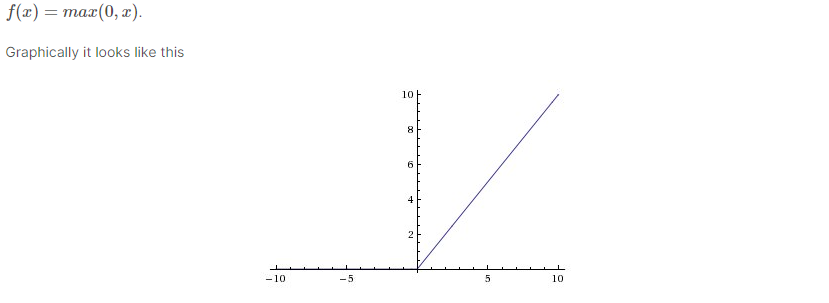

It's surprising that such a simple function (and one composed of two linear pieces) can allow your model to account for non-linearities and interactions so well. But the ReLU function works great in most applications, and it is very widely used as a result.

## LeakyRelu Activation Function

Leaky ReLU (Rectified Linear Unit) is an extension of the standard ReLU activation function. The standard ReLU function returns 0 for any input value less than 0 and returns the input value for any input value greater than or equal to 0. The Leaky ReLU function, on the other hand, returns a small negative slope for input values less than 0 and returns the input value for any input value greater than or equal to 0. The small negative slope is controlled by a small parameter alpha, which is typically set to a value between 0.01 and 0.2.

The main advantage of using Leaky ReLU over ReLU is that it addresses the "dying ReLU" problem. In ReLU, if the input is negative, the output is always 0, which can cause the gradients to be 0 as well, resulting in the neurons being "dead" and unable to learn. Leaky ReLU allows a small non-zero gradient for negative input values, which can help to prevent the neurons from dying.

In addition, Leaky ReLU is also more robust to noise and can help to prevent overfitting in some cases.

In summary, Leaky ReLU is an extension of the standard ReLU activation function that allows a small non-zero gradient for negative input values, addressing the "dying ReLU" problem and making it more robust to noise and overfitting.

## Dense Layer

In any neural network, a dense layer is a layer that is deeply connected with its preceding layer which means the neurons of the layer are connected to every neuron of its preceding layer. This layer is the most commonly used layer in artificial neural network networks.

## Softmax Activation Function 

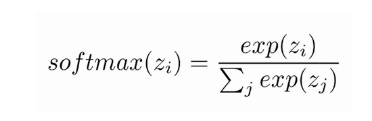

Here, the Z represents the values from the neurons of the output layer. The exponential acts as the non-linear function. Later these values are divided by the sum of exponential values in order to normalize and then convert them into probabilities.

Let’s understand with a simple example how the softmax works, We have the following neural network:

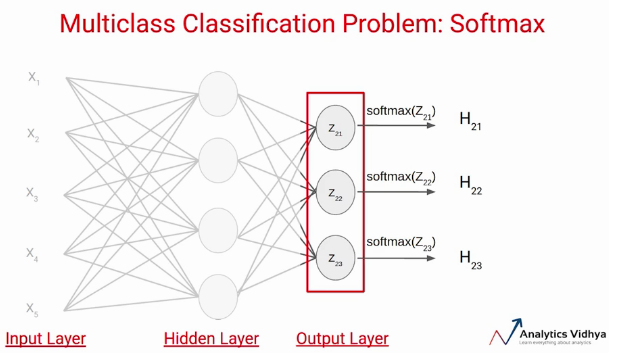

Suppose the value of Z21, Z22, Z23 comes out to be 2.33, -1.46, and 0.56 respectively. Now the SoftMax activation function is applied to each of these neurons and the following values are generated.

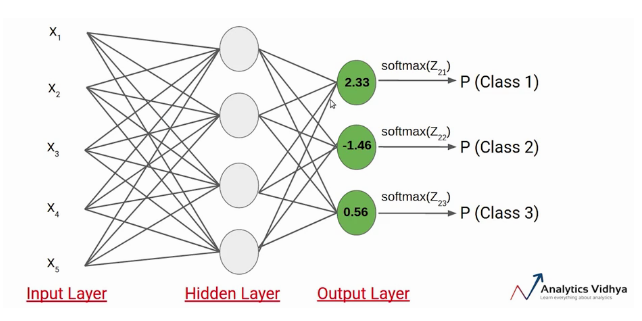

In this case it clear that the input belongs to class 1. So if the probability of any of these classes is changed, the probability value of the first class would also change.

## Adam Optimizer

Adam can be looked at as a combination of RMSprop and Stochastic Gradient Descent with momentum. It uses the squared gradients to scale the learning rate like RMSprop and it takes advantage of momentum by using moving average of the gradient instead of gradient itself like SGD with momentum.

## Binary Crossentropy loss

Binary Cross-Entropy Loss (BCE Loss) is a loss function commonly used in binary classification problems. The BCE Loss measures the dissimilarity between the predicted probability distribution and the true distribution. Given a set of predicted probability values for a binary class and the true class labels, BCE Loss is calculated as the negative log-likelihood of the true labels. Mathematically, it is represented as -(y * log(p) + (1-y) * log(1-p)), where y is the true label and p is the predicted probability of the positive class. The BCE Loss function is easy to optimize and computationally efficient. The BCE loss is sensitive to the outliers or rare events, if the dataset is unbalanced, it is better to use Focal loss instead of BCE loss.

## Kernel Initializer

The neural network needs to start with some weights and then iteratively update them to better values. The term kernel_initializer is a fancy term for which statistical distribution or function to use for initializing the weights. In the case of statistical distribution, the library will generate numbers from that statistical distribution and use them as starting weights.

The term kernel is a carryover from other classical methods like SVM. The idea is to transform data in a given input space to another space where the transformation is achieved using kernel functions. We can think of neural network layers as non-linear maps doing these transformations, so the term kernels is used.

## Early Stopping
Overfitting occurs when a neural network is trained to the point that it begins to memorize rather than generalize.
There are a number of parameters that are specified to the EarlyStopping object.

min_delta:
This value should be kept small. It simply means the minimum change in error to be registered as an improvement. Setting it even smaller will not likely have a great deal of impact.

patience:
How long should the training wait for the validation error to improve?

verbose:
How much progress information do you want?

mode:
In general, always set this to "auto". This allows you to specify if the error should be minimized or maximized. Consider accuracy, where higher numbers are desired vs log-loss/RMSE where lower numbers are desired.

restore_best_weights:
This should always be set to true. This restores the weights to the values they were at when the validation set is the highest. Unless you are manually tracking the weights yourself (we do not use this technique in this course), you should have Keras perform this step for you.
As you can see from above, the entire number of requested epochs were not used. The neural network training stopped once the validation set no longer improved.

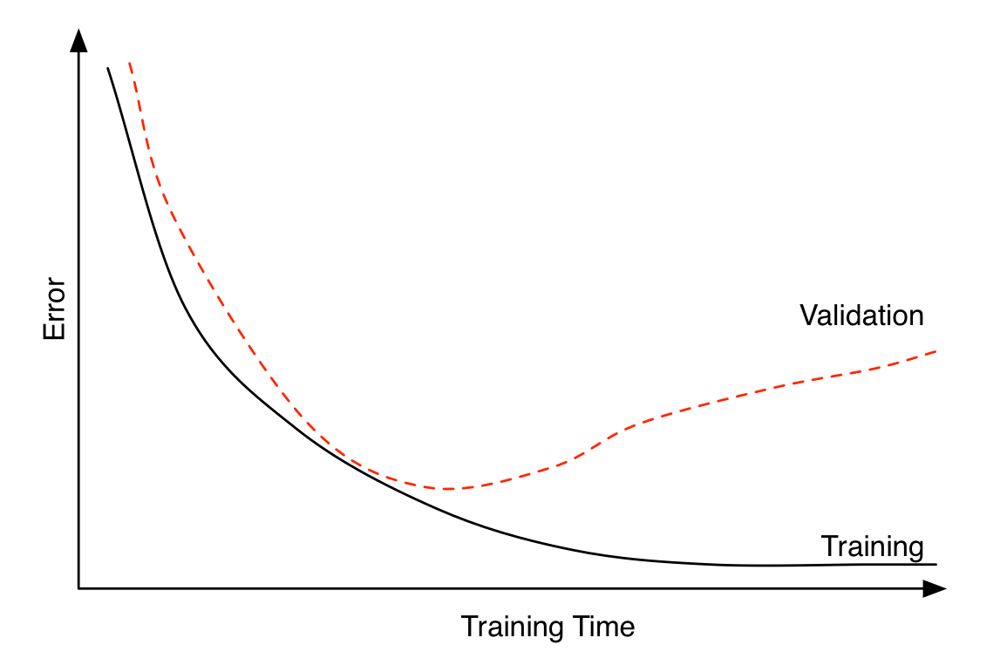

## Implementation

In this study, we have implemented several different architectures for a binary classification problem using a tabular data with a low size of the dataset. Our goal was to find an optimal architecture that would achieve the highest accuracy.

We first tried adding more layers to the model, but we found that this approach led to overfitting. This was likely due to the fact that the model had too much capacity to fit the small dataset, resulting in poor generalization performance on unseen data.

Next, we added regularization techniques, such as L1 and L2 regularization, to the model. We found that this approach decreased the accuracy of the model but made it less noisy. This is because regularization helps to prevent overfitting by adding a penalty term to the loss function, which encourages the model to have smaller weight values. However, this can also lead to underfitting, as the model is not able to fit the training data as well.

We also found that dropout layers were crucial for the model's performance. Dropout is a regularization technique that randomly sets a certain proportion of neurons to zero during training, which helps to prevent overfitting by reducing the co-adaptation of neurons.

Finally, we found that the model's hyperparameters had a huge dependency on the model's architecture. This means that the optimal values of hyperparameters, such as the number of layers and neurons, dropout rate, and regularization strength, will vary depending on the specific architecture of the model.

In conclusion, we found that when working with a small dataset, it's important to use a relatively simple model architecture and to apply regularization techniques to prevent overfitting. Dropout layers are also important for regularization, and the optimal values of hyperparameters will depend on the specific architecture of the model.

## Hyperparameter Optimization Using Parallel Processing with Shared Memory

Hyperparameter optimization is the problem of optimizing a loss function over a graph-structured configuration space. Hyperparameters may have a significant impact on model accuracy and their optimization is highly computation-demanding process due to the multiple training runs required. It is possible to run such optimization in parallel using independent models. Embarrassingly parallel programming is a form of parallel algorithms requiring almost no communication between the processes where each process can perform their own computations without any need for communication with the others. Today, most computers have a multicore architecture using the same shared memory, where each core has a private memory. The shared memory architecture is illustrated in the Figure below:

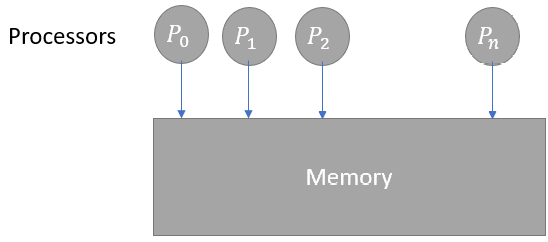

Embarrassingly parallel algorithms can easily improve execution time of a single task while implementing them correctly. Monte Carlo Simulations and Mandelbrot Sets (also known as Fractals) are examples for embarrassingly parallel algorithms. The ideal case of embarrassingly parallel algorithms. is that all subproblems/tasks are defined before the computations begin. In that case, all the subsolutions are stored in independent memory locations (arrays, variables, etc.). Thus, the computation of the subsolutions is completely independent. We used Parallel Computation and Task Scheduling with Dask, a Python library extension which enables parallel out-of-core computation. Dask has many built-in functions which enables dynamic and memory aware task scheduling to achieve parallelism. The following list represents the values of the different hyperparameters of the independent neural network function, f(learning_list_i,dense_list_i,drop_list_i,patience_list_i), which are ran in parallel on different cores:

In [68]:
learning_list = [0.00001,0.00005,0.0001,0.0005,0.001,0.01]
batch_list = list(range(1,101,20))
dense_list = list(range(2,103,20))
drop_list = list(np.linspace(0.001, 0.5, 4))
patience_list = list(range(2,18,3))

print(dense_list,len(dense_list))
print(drop_list,len(drop_list))
print(patience_list,len(patience_list))
print(learning_list,len(learning_list))

[2, 22, 42, 62, 82, 102] 6
[0.001, 0.16733333333333333, 0.33366666666666667, 0.5] 4
[2, 5, 8, 11, 14, 17] 6
[1e-05, 5e-05, 0.0001, 0.0005, 0.001, 0.01] 6


In [69]:
daskD = Client(n_workers=6,threads_per_worker=1) # here we set the number of workers for the parallel computations
daskD

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 6
Total threads: 6,Total memory: 7.92 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:56662,Workers: 6
Dashboard: http://127.0.0.1:8787/status,Total threads: 6
Started: Just now,Total memory: 7.92 GiB
Comm: tcp://127.0.0.1:56722,Total threads: 1
Dashboard: http://127.0.0.1:56723/status,Memory: 1.32 GiB
Nanny: tcp://127.0.0.1:56668,


In [70]:
x_train = torch.from_numpy(x_train).float()
x_val = torch.from_numpy(x_test).float()
y_train = torch.from_numpy(y_train.values)

y_val = torch.from_numpy(y_test.values)
y_train = y_train.float()
y_val = y_val.float()

In [71]:
# First Model
class Net1(nn.Module):
    def __init__(self, dense_list, drop_list):
        super(Net1, self).__init__()
        self.fc1 = nn.Linear(44, dense_list)
        self.batch_norm1 = nn.BatchNorm1d(dense_list)
        self.fc2 = nn.Linear(dense_list, dense_list//2)
        self.batch_norm2 = nn.BatchNorm1d(dense_list//2)
        self.fc3 = nn.Linear(dense_list//2, 1)
        self.dropout = nn.Dropout(drop_list)
        
    def forward(self, x):
        x = F.relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout(x)
        x = F.relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout(x)
        x = torch.sigmoid(self.fc3(x))
        return x


# Second model
class Net2(nn.Module):
    def __init__(self, dense_list, drop_list):
        super(Net2, self).__init__()
        self.fc1 = nn.Linear(44, dense_list)
        self.fc2 = nn.Linear(dense_list, dense_list)
        self.dropout1 = nn.Dropout(drop_list)
        self.fc3 = nn.Linear(dense_list, dense_list)
        self.dropout2 = nn.Dropout(drop_list)
        self.fc4 = nn.Linear(dense_list, dense_list)
        self.fc5 = nn.Linear(dense_list, 1)
        
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.dropout1(x)
        x = F.relu(self.fc3(x))
        x = self.dropout2(x)
        x = F.relu(self.fc4(x))
        x = torch.sigmoid(self.fc5(x))
        return x

# Third Model
class Net3(nn.Module):
    def __init__(self, dense_list, drop_list, l1_reg=0, l2_reg=0):
        super(Net3, self).__init__()
        self.fc1 = nn.Linear(44, dense_list)
        self.dropout1 = nn.Dropout(drop_list)
        self.bn1 = nn.BatchNorm1d(dense_list)
        self.fc2 = nn.Linear(dense_list, 1)
        self.l1_reg = l1_reg
        self.l2_reg = l2_reg
        
    def forward(self, x):
        x = F.relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = torch.sigmoid(self.fc2(x))
        return x

    def l1_l2_regularization(self, param):
        return self.l1_reg * torch.norm(param, 1) + self.l2_reg * torch.norm(param, 2)

    def regularization(self):
        l1_reg_loss = 0
        l2_reg_loss = 0
        for param in self.parameters():
            l1_reg_loss += self.l1_l2_regularization(param)
        return l1_reg_loss

# 4th Model
class Net4(nn.Module): 
    def __init__(self, dense_list, drop_list):
        super(Net4, self).__init__()
        self.fc1 = nn.Linear(44, dense_list)
        self.batch_norm1 = nn.BatchNorm1d(dense_list)
        self.fc2 = nn.Linear(dense_list, dense_list*2)
        self.batch_norm2 = nn.BatchNorm1d(dense_list*2)
        self.fc3 = nn.Linear(dense_list*2, dense_list*3)
        self.batch_norm3 = nn.BatchNorm1d(dense_list*3)
        self.fc4 = nn.Linear(dense_list*3, dense_list*4)
        self.batch_norm4 = nn.BatchNorm1d(dense_list*4)
        self.fc5 = nn.Linear(dense_list*4, dense_list*5)
        self.batch_norm5 = nn.BatchNorm1d(dense_list*5)
        self.fc6 = nn.Linear(dense_list*5, 1)
        self.dropout1 = nn.Dropout(drop_list)
        self.dropout2 = nn.Dropout(drop_list)
        self.dropout3 = nn.Dropout(drop_list)
        self.dropout4 = nn.Dropout(drop_list)
        self.dropout5 = nn.Dropout(drop_list)
        
    def forward(self, x):
        x = F.leaky_relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout1(x)
        x = F.leaky_relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout2(x)
        x = F.leaky_relu(self.batch_norm3(self.fc3(x)))
        x = self.dropout3(x)
        x = F.leaky_relu(self.batch_norm4(self.fc4(x)))
        x = self.dropout4(x)
        x = F.leaky_relu(self.batch_norm5(self.fc5(x)))
        x = self.dropout5(x)
        x = torch.sigmoid(self.fc6(x))
        return x

# 5th Model - adding l1 and l2 regularization techniques
class Net5(nn.Module):
    def __init__(self, dense_list, drop_list, l1_reg=1e-6, l2_reg=1e-6):
        super(Net5, self).__init__()
        self.fc1 = nn.Linear(44, dense_list*2)
        self.batch_norm1 = nn.BatchNorm1d(dense_list*2)
        self.fc2 = nn.Linear(dense_list*2, dense_list)
        self.batch_norm2 = nn.BatchNorm1d(dense_list)
        self.fc3 = nn.Linear(dense_list, 1)
        self.dropout1 = nn.Dropout(drop_list)
        self.dropout2 = nn.Dropout(drop_list)
        self.l1_reg = l1_reg
        self.l2_reg = l2_reg
        
    def forward(self, x):
        x = F.leaky_relu(self.batch_norm1(self.fc1(x)))
        x = self.dropout1(x)
        x = F.leaky_relu(self.batch_norm2(self.fc2(x)))
        x = self.dropout2(x)
        x = torch.sigmoid(self.fc3(x))
        return x
    
    def l1_l2_regularization(self, param):
        return self.l1_reg * torch.norm(param, 1) + self.l2_reg * torch.norm(param, 2)

    def regularization(self):
        l1_reg_loss = 0
        for param in self.parameters():
            l1_reg_loss += self.l1_l2_regularization(param)
        return l1_reg_loss
    
criterion = nn.BCELoss()

def evaluate(model, x, y):
    with torch.no_grad():
        y_pred = model(x)
        y_pred = y_pred.round()
        accuracy = (y_pred == y).float().mean()
        loss = criterion(y_pred, y)
        return loss.item(), accuracy.item()  
    
def plot_loss_acc(history):
    train_loss = history["train_loss"]
    val_loss = history["val_loss"]
    train_acc = history['train_acc']
    val_acc = history['val_acc']
    color1 = DEFAULT_PLOTLY_COLORS[0]
    color2 = DEFAULT_PLOTLY_COLORS[1]
    color3 = DEFAULT_PLOTLY_COLORS[2]
    color4 = DEFAULT_PLOTLY_COLORS[3]
    # Create trace for train loss
    trace1 = go.Scatter(x = list(range(len(train_loss))), y = train_loss, mode='lines', name='train loss', line=dict(width=1, color=color1))
    # Create trace for val loss
    trace2 = go.Scatter(x = list(range(len(val_loss))), y = val_loss, mode='lines', name='val loss', line=dict(width=1, color=color2))
    # Create trace for train accuracy
    trace3 = go.Scatter(x = list(range(len(train_acc))), y = train_acc, mode='lines', name='train acc', line=dict(width=1, color=color3))
    # Create trace for val accuracy
    trace4 = go.Scatter(x = list(range(len(val_acc))), y = val_acc, mode='lines', name='val acc', line=dict(width=1, color=color4))
    # Add all traces to data
    data = [trace1, trace2, trace3, trace4]
    # Create the layout
    layout = go.Layout(title='Train and Validation Loss and Accuracy', xaxis=dict(title='epoch'))
    # Create the figure
    fig = go.Figure(data=data, layout=layout)
    # Show the figure
    fig.show()

In [72]:
#This is only the function that runs the model on small batches, which didn't gave us any better results,
#but just cause to long executio time.

# def createmodel(batch_list,dense_list,drop_list,patience_list, learning_list): # with splitting into batches
#     model = Net(dense_list, drop_list)
#     criterion = nn.BCELoss()
#     optimizer = torch.optim.Adam(model.parameters(), learning_list)
#     patience = patience_list
#     best_loss = float('inf')
#     best_model = None

#     train_data = DataLoader(dataset = TensorDataset(x_train, y_train), batch_size = 600, shuffle = True)
#     validation_data = DataLoader(dataset = TensorDataset(x_val, y_val), batch_size = 600, shuffle = False)
#     history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}
#     training_loss = []
#     training_acc = []
#     validation_loss = []
#     validation_acc = []
#     for epoch in range(300):
#         avg_loss = 0
#         avg_acc = 0
#         for i, (x_batch, y_batch) in enumerate(train_data):
#             optimizer.zero_grad()
#             output = model(x_batch)
#             loss = criterion(output, y_batch)
#             loss.backward()
#             optimizer.step()
#             avg_loss += loss.item()
#             acc = (output.round() == y_batch).float().mean()
#             avg_acc += acc
#         avg_loss /= len(train_data)
#         avg_acc /= len(train_data)
#         history['train_loss'].append(avg_loss)
#         history['train_acc'].append(avg_acc)
        
#         # validate the model
#         val_loss = 0
#         val_acc = 0
#         for i, (x_val_batch, y_val_batch) in enumerate(validation_data):
#             with torch.no_grad():
#                 val_output = model(x_val_batch)
#                 val_loss += criterion(val_output, y_val_batch)
#                 val_acc += (val_output.round() == y_val_batch).float().mean()
#         val_loss /= len(validation_data)
#         val_acc /= len(validation_data)
#         history['val_loss'].append(val_loss)
#         history['val_acc'].append(val_acc)
        
#         if avg_loss < best_loss:
#             best_loss = avg_loss
#             best_model = model
#             patience = patience_list
#         else:
#             patience -= 1
#         if patience == 0:
#             break
#     model = best_model
# #     train_scores = model.evaluate(x_train, y_train, verbose=1)
# #     test_scores = model.evaluate(x_test,y_test, verbose=1)
#     number_of_epochs_it_ran = epoch
#     distance = train_scores[1] - test_scores[0]
#     return train_scores, test_scores, number_of_epochs_it_ran, distance, history

## First Architecture results:

In [73]:
@dask.delayed # without splitting into batches
def createmodel1(dense_list, drop_list, patience_list, learning_list):
    model = Net1(dense_list, drop_list)
    optimizer = torch.optim.Adam(model.parameters(), learning_list)
    criterion = nn.BCELoss()
    history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}
    best_val_loss = float("inf")
    non_improvement_count = 0
    
    for epoch in range(300):
        optimizer.zero_grad()
        y_pred = model(x_train)
        loss = criterion(y_pred, y_train)
        history["train_loss"].append(loss.item())
        train_acc = (y_pred.round() == y_train).float().mean()
        history["train_acc"].append(train_acc)
        loss.backward()
        optimizer.step()
        y_val_pred = model(x_val)
        val_loss = criterion(y_val_pred, y_val)
        history["val_loss"].append(val_loss.item())
        val_acc = (y_val_pred.round() == y_val).float().mean()
        history["val_acc"].append(val_acc)
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            non_improvement_count = 0
        else:
            non_improvement_count += 1
        if non_improvement_count >= patience_list:
            print("Early stopping at epoch {}".format(epoch))
            break
            
    train_scores = evaluate(model, x_train, y_train)
    test_scores = evaluate(model, x_val, y_val)
    number_of_epochs_it_ran = len(history["val_loss"])
    distance = train_scores[1] - test_scores[0]
    
    return train_scores, test_scores, number_of_epochs_it_ran, distance, history

In [74]:
daskList1 = []
temp = 0

for k in range(len(dense_list)):
    for x in range(len(drop_list)):
        for i in range(len(patience_list)):
            for l in range(len(learning_list)):
                s = createmodel1(dense_list[k],drop_list[x],patience_list[i],learning_list[l])
                daskList1.append(s)
                print(f'{k}.{x}.{i}.{l}')
                print(temp)
                temp = temp + 1
len(daskList1)

0.0.0.0
0
0.0.0.1
1
0.0.0.2
2
0.0.0.3
3
0.0.0.4
4
0.0.0.5
5
0.0.1.0
6
0.0.1.1
7
0.0.1.2
8
0.0.1.3
9
0.0.1.4
10
0.0.1.5
11
0.0.2.0
12
0.0.2.1
13
0.0.2.2
14
0.0.2.3
15
0.0.2.4
16
0.0.2.5
17
0.0.3.0
18
0.0.3.1
19
0.0.3.2
20
0.0.3.3
21
0.0.3.4
22
0.0.3.5
23
0.0.4.0
24
0.0.4.1
25
0.0.4.2
26
0.0.4.3
27
0.0.4.4
28
0.0.4.5
29
0.0.5.0
30
0.0.5.1
31
0.0.5.2
32
0.0.5.3
33
0.0.5.4
34
0.0.5.5
35
0.1.0.0
36
0.1.0.1
37
0.1.0.2
38
0.1.0.3
39
0.1.0.4
40
0.1.0.5
41
0.1.1.0
42
0.1.1.1
43
0.1.1.2
44
0.1.1.3
45
0.1.1.4
46
0.1.1.5
47
0.1.2.0
48
0.1.2.1
49
0.1.2.2
50
0.1.2.3
51
0.1.2.4
52
0.1.2.5
53
0.1.3.0
54
0.1.3.1
55
0.1.3.2
56
0.1.3.3
57
0.1.3.4
58
0.1.3.5
59
0.1.4.0
60
0.1.4.1
61
0.1.4.2
62
0.1.4.3
63
0.1.4.4
64
0.1.4.5
65
0.1.5.0
66
0.1.5.1
67
0.1.5.2
68
0.1.5.3
69
0.1.5.4
70
0.1.5.5
71
0.2.0.0
72
0.2.0.1
73
0.2.0.2
74
0.2.0.3
75
0.2.0.4
76
0.2.0.5
77
0.2.1.0
78
0.2.1.1
79
0.2.1.2
80
0.2.1.3
81
0.2.1.4
82
0.2.1.5
83
0.2.2.0
84
0.2.2.1
85
0.2.2.2
86
0.2.2.3
87
0.2.2.4
88
0.2.2.5
89
0.2.3.0
90
0.2.3.1
9

864

In [75]:
%%time
sa1 = dask.compute(*daskList1)

CPU times: total: 36.1 s
Wall time: 1min 16s


In [76]:
# Choosing the best model based on the highest validation accuracy
best_list=[]
best_model = 0
best_model_index = 0

for i in range(len(sa1)):
    if sa1[i][4]['val_acc'][-1] > best_model:
        best_model=sa1[i][4]['val_acc'][-1]
        best_model_index = i
    
print(best_model ,best_model_index)
plot_loss_acc(sa1[best_model_index][4])

tensor(0.8727) 173


## Second Architecture results:

In [77]:
@dask.delayed # without splitting into batches
def createmodel2(dense_list, drop_list, patience_list, learning_list):
    model = Net2(dense_list, drop_list)
    optimizer = torch.optim.Adam(model.parameters(), learning_list)
    criterion = nn.BCELoss()
    history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}
    best_val_loss = float("inf")
    non_improvement_count = 0
    
    for epoch in range(300):
        optimizer.zero_grad()
        y_pred = model(x_train)
        loss = criterion(y_pred, y_train)
        history["train_loss"].append(loss.item())
        train_acc = (y_pred.round() == y_train).float().mean()
        history["train_acc"].append(train_acc)
        loss.backward()
        optimizer.step()
        y_val_pred = model(x_val)
        val_loss = criterion(y_val_pred, y_val)
        history["val_loss"].append(val_loss.item())
        val_acc = (y_val_pred.round() == y_val).float().mean()
        history["val_acc"].append(val_acc)
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            non_improvement_count = 0
        else:
            non_improvement_count += 1
        if non_improvement_count >= patience_list:
            print("Early stopping at epoch {}".format(epoch))
            break
            
    train_scores = evaluate(model, x_train, y_train)
    test_scores = evaluate(model, x_val, y_val)
    number_of_epochs_it_ran = len(history["val_loss"])
    distance = train_scores[1] - test_scores[0]
    
    return train_scores, test_scores, number_of_epochs_it_ran, distance, history

In [78]:
daskList2 = []
temp = 0

for k in range(len(dense_list)):
    for x in range(len(drop_list)):
        for i in range(len(patience_list)):
            for l in range(len(learning_list)):
                s = createmodel2(dense_list[k],drop_list[x],patience_list[i],learning_list[l])
                daskList2.append(s)
                print(f'{k}.{x}.{i}.{l}')
                print(temp)
                temp = temp + 1
len(daskList2)

0.0.0.0
0
0.0.0.1
1
0.0.0.2
2
0.0.0.3
3
0.0.0.4
4
0.0.0.5
5
0.0.1.0
6
0.0.1.1
7
0.0.1.2
8
0.0.1.3
9
0.0.1.4
10
0.0.1.5
11
0.0.2.0
12
0.0.2.1
13
0.0.2.2
14
0.0.2.3
15
0.0.2.4
16
0.0.2.5
17
0.0.3.0
18
0.0.3.1
19
0.0.3.2
20
0.0.3.3
21
0.0.3.4
22
0.0.3.5
23
0.0.4.0
24
0.0.4.1
25
0.0.4.2
26
0.0.4.3
27
0.0.4.4
28
0.0.4.5
29
0.0.5.0
30
0.0.5.1
31
0.0.5.2
32
0.0.5.3
33
0.0.5.4
34
0.0.5.5
35
0.1.0.0
36
0.1.0.1
37
0.1.0.2
38
0.1.0.3
39
0.1.0.4
40
0.1.0.5
41
0.1.1.0
42
0.1.1.1
43
0.1.1.2
44
0.1.1.3
45
0.1.1.4
46
0.1.1.5
47
0.1.2.0
48
0.1.2.1
49
0.1.2.2
50
0.1.2.3
51
0.1.2.4
52
0.1.2.5
53
0.1.3.0
54
0.1.3.1
55
0.1.3.2
56
0.1.3.3
57
0.1.3.4
58
0.1.3.5
59
0.1.4.0
60
0.1.4.1
61
0.1.4.2
62
0.1.4.3
63
0.1.4.4
64
0.1.4.5
65
0.1.5.0
66
0.1.5.1
67
0.1.5.2
68
0.1.5.3
69
0.1.5.4
70
0.1.5.5
71
0.2.0.0
72
0.2.0.1
73
0.2.0.2
74
0.2.0.3
75
0.2.0.4
76
0.2.0.5
77
0.2.1.0
78
0.2.1.1
79
0.2.1.2
80
0.2.1.3
81
0.2.1.4
82
0.2.1.5
83
0.2.2.0
84
0.2.2.1
85
0.2.2.2
86
0.2.2.3
87
0.2.2.4
88
0.2.2.5
89
0.2.3.0
90
0.2.3.1
9

5.3.1.0
834
5.3.1.1
835
5.3.1.2
836
5.3.1.3
837
5.3.1.4
838
5.3.1.5
839
5.3.2.0
840
5.3.2.1
841
5.3.2.2
842
5.3.2.3
843
5.3.2.4
844
5.3.2.5
845
5.3.3.0
846
5.3.3.1
847
5.3.3.2
848
5.3.3.3
849
5.3.3.4
850
5.3.3.5
851
5.3.4.0
852
5.3.4.1
853
5.3.4.2
854
5.3.4.3
855
5.3.4.4
856
5.3.4.5
857
5.3.5.0
858
5.3.5.1
859
5.3.5.2
860
5.3.5.3
861
5.3.5.4
862
5.3.5.5
863


864

In [79]:
%%time
sa2 = dask.compute(*daskList2)

CPU times: total: 48.7 s
Wall time: 2min 4s


In [80]:
# Choosing the best model based on the highest validation accuracy
best_list=[]
best_model = 0
best_model_index = 0

for i in range(len(sa2)):
    if sa2[i][4]['val_acc'][-1] > best_model:
        best_model=sa2[i][4]['val_acc'][-1]
        best_model_index = i
    
print(best_model ,best_model_index)
plot_loss_acc(sa2[best_model_index][4])

tensor(0.9273) 826


## Third Architecture results:

In [81]:
@dask.delayed # without splitting into batches
def createmodel3(dense_list, drop_list, patience_list, learning_list):
    model = Net3(dense_list, drop_list)
    optimizer = torch.optim.Adam(model.parameters(), learning_list)
    criterion = nn.BCELoss()
    history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}
    best_val_loss = float("inf")
    non_improvement_count = 0
    
    for epoch in range(300):
        optimizer.zero_grad()
        y_pred = model(x_train)
        loss = criterion(y_pred, y_train)
        history["train_loss"].append(loss.item())
        train_acc = (y_pred.round() == y_train).float().mean()
        history["train_acc"].append(train_acc)
        loss.backward()
        optimizer.step()
        y_val_pred = model(x_val)
        val_loss = criterion(y_val_pred, y_val)
        history["val_loss"].append(val_loss.item())
        val_acc = (y_val_pred.round() == y_val).float().mean()
        history["val_acc"].append(val_acc)
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            non_improvement_count = 0
        else:
            non_improvement_count += 1
        if non_improvement_count >= patience_list:
            print("Early stopping at epoch {}".format(epoch))
            break
            
    train_scores = evaluate(model, x_train, y_train)
    test_scores = evaluate(model, x_val, y_val)
    number_of_epochs_it_ran = len(history["val_loss"])
    distance = train_scores[1] - test_scores[0]
    
    return train_scores, test_scores, number_of_epochs_it_ran, distance, history

In [82]:
daskList3 = []
temp = 0

for k in range(len(dense_list)):
    for x in range(len(drop_list)):
        for i in range(len(patience_list)):
            for l in range(len(learning_list)):
                s = createmodel3(dense_list[k],drop_list[x],patience_list[i],learning_list[l])
                daskList3.append(s)
                print(f'{k}.{x}.{i}.{l}')
                print(temp)
                temp = temp + 1
len(daskList3)

0.0.0.0
0
0.0.0.1
1
0.0.0.2
2
0.0.0.3
3
0.0.0.4
4
0.0.0.5
5
0.0.1.0
6
0.0.1.1
7
0.0.1.2
8
0.0.1.3
9
0.0.1.4
10
0.0.1.5
11
0.0.2.0
12
0.0.2.1
13
0.0.2.2
14
0.0.2.3
15
0.0.2.4
16
0.0.2.5
17
0.0.3.0
18
0.0.3.1
19
0.0.3.2
20
0.0.3.3
21
0.0.3.4
22
0.0.3.5
23
0.0.4.0
24
0.0.4.1
25
0.0.4.2
26
0.0.4.3
27
0.0.4.4
28
0.0.4.5
29
0.0.5.0
30
0.0.5.1
31
0.0.5.2
32
0.0.5.3
33
0.0.5.4
34
0.0.5.5
35
0.1.0.0
36
0.1.0.1
37
0.1.0.2
38
0.1.0.3
39
0.1.0.4
40
0.1.0.5
41
0.1.1.0
42
0.1.1.1
43
0.1.1.2
44
0.1.1.3
45
0.1.1.4
46
0.1.1.5
47
0.1.2.0
48
0.1.2.1
49
0.1.2.2
50
0.1.2.3
51
0.1.2.4
52
0.1.2.5
53
0.1.3.0
54
0.1.3.1
55
0.1.3.2
56
0.1.3.3
57
0.1.3.4
58
0.1.3.5
59
0.1.4.0
60
0.1.4.1
61
0.1.4.2
62
0.1.4.3
63
0.1.4.4
64
0.1.4.5
65
0.1.5.0
66
0.1.5.1
67
0.1.5.2
68
0.1.5.3
69
0.1.5.4
70
0.1.5.5
71
0.2.0.0
72
0.2.0.1
73
0.2.0.2
74
0.2.0.3
75
0.2.0.4
76
0.2.0.5
77
0.2.1.0
78
0.2.1.1
79
0.2.1.2
80
0.2.1.3
81
0.2.1.4
82
0.2.1.5
83
0.2.2.0
84
0.2.2.1
85
0.2.2.2
86
0.2.2.3
87
0.2.2.4
88
0.2.2.5
89
0.2.3.0
90
0.2.3.1
9

864

In [83]:
%%time
sa3 = dask.compute(*daskList3)

CPU times: total: 33.4 s
Wall time: 57.2 s


In [84]:
# Choosing the best model based on the highest validation accuracy
best_list=[]
best_model = 0
best_model_index = 0

for i in range(len(sa3)):
    if sa3[i][4]['val_acc'][-1] > best_model:
        best_model=sa3[i][4]['val_acc'][-1]
        best_model_index = i
    
print(best_model ,best_model_index)
plot_loss_acc(sa3[best_model_index][4])

tensor(0.8182) 179


## 4th Architecture results:

In [85]:
@dask.delayed # without splitting into batches
def createmodel4(dense_list, drop_list, patience_list, learning_list):
    model = Net4(dense_list, drop_list)
    optimizer = torch.optim.Adam(model.parameters(), learning_list)
    criterion = nn.BCELoss()
    history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}
    best_val_loss = float("inf")
    non_improvement_count = 0
    
    for epoch in range(300):
        optimizer.zero_grad()
        y_pred = model(x_train)
        loss = criterion(y_pred, y_train)
        history["train_loss"].append(loss.item())
        train_acc = (y_pred.round() == y_train).float().mean()
        history["train_acc"].append(train_acc)
        loss.backward()
        optimizer.step()
        y_val_pred = model(x_val)
        val_loss = criterion(y_val_pred, y_val)
        history["val_loss"].append(val_loss.item())
        val_acc = (y_val_pred.round() == y_val).float().mean()
        history["val_acc"].append(val_acc)
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            non_improvement_count = 0
        else:
            non_improvement_count += 1
        if non_improvement_count >= patience_list:
            print("Early stopping at epoch {}".format(epoch))
            break
            
    train_scores = evaluate(model, x_train, y_train)
    test_scores = evaluate(model, x_val, y_val)
    number_of_epochs_it_ran = len(history["val_loss"])
    distance = train_scores[1] - test_scores[0]
    
    return train_scores, test_scores, number_of_epochs_it_ran, distance, history

In [86]:
daskList4 = []
temp = 0

for k in range(len(dense_list)):
    for x in range(len(drop_list)):
        for i in range(len(patience_list)):
            for l in range(len(learning_list)):
                s = createmodel4(dense_list[k],drop_list[x],patience_list[i],learning_list[l])
                daskList4.append(s)
                print(f'{k}.{x}.{i}.{l}')
                print(temp)
                temp = temp + 1
len(daskList4)

0.0.0.0
0
0.0.0.1
1
0.0.0.2
2
0.0.0.3
3
0.0.0.4
4
0.0.0.5
5
0.0.1.0
6
0.0.1.1
7
0.0.1.2
8
0.0.1.3
9
0.0.1.4
10
0.0.1.5
11
0.0.2.0
12
0.0.2.1
13
0.0.2.2
14
0.0.2.3
15
0.0.2.4
16
0.0.2.5
17
0.0.3.0
18
0.0.3.1
19
0.0.3.2
20
0.0.3.3
21
0.0.3.4
22
0.0.3.5
23
0.0.4.0
24
0.0.4.1
25
0.0.4.2
26
0.0.4.3
27
0.0.4.4
28
0.0.4.5
29
0.0.5.0
30
0.0.5.1
31
0.0.5.2
32
0.0.5.3
33
0.0.5.4
34
0.0.5.5
35
0.1.0.0
36
0.1.0.1
37
0.1.0.2
38
0.1.0.3
39
0.1.0.4
40
0.1.0.5
41
0.1.1.0
42
0.1.1.1
43
0.1.1.2
44
0.1.1.3
45
0.1.1.4
46
0.1.1.5
47
0.1.2.0
48
0.1.2.1
49
0.1.2.2
50
0.1.2.3
51
0.1.2.4
52
0.1.2.5
53
0.1.3.0
54
0.1.3.1
55
0.1.3.2
56
0.1.3.3
57
0.1.3.4
58
0.1.3.5
59
0.1.4.0
60
0.1.4.1
61
0.1.4.2
62
0.1.4.3
63
0.1.4.4
64
0.1.4.5
65
0.1.5.0
66
0.1.5.1
67
0.1.5.2
68
0.1.5.3
69
0.1.5.4
70
0.1.5.5
71
0.2.0.0
72
0.2.0.1
73
0.2.0.2
74
0.2.0.3
75
0.2.0.4
76
0.2.0.5
77
0.2.1.0
78
0.2.1.1
79
0.2.1.2
80
0.2.1.3
81
0.2.1.4
82
0.2.1.5
83
0.2.2.0
84
0.2.2.1
85
0.2.2.2
86
0.2.2.3
87
0.2.2.4
88
0.2.2.5
89
0.2.3.0
90
0.2.3.1
9

864

In [87]:
%%time
sa4 = dask.compute(*daskList4)

CPU times: total: 1min 8s
Wall time: 5min 5s


In [88]:
# Choosing the best model based on the highest validation accuracy
best_list=[]
best_model = 0
best_model_index = 0

for i in range(len(sa4)):
    if sa4[i][4]['val_acc'][-1] > best_model:
        best_model=sa4[i][4]['val_acc'][-1]
        best_model_index = i
    
print(best_model ,best_model_index)
plot_loss_acc(sa4[best_model_index][4])

tensor(0.8909) 316


## 5th Architecture results:

In [89]:
@dask.delayed # without splitting into batches
def createmodel5(dense_list, drop_list, patience_list, learning_list):
    model = Net5(dense_list, drop_list)
    optimizer = torch.optim.Adam(model.parameters(), learning_list)
    criterion = nn.BCELoss()
    history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}
    best_val_loss = float("inf")
    non_improvement_count = 0
    
    for epoch in range(300):
        optimizer.zero_grad()
        y_pred = model(x_train)
        loss = criterion(y_pred, y_train)
        history["train_loss"].append(loss.item())
        train_acc = (y_pred.round() == y_train).float().mean()
        history["train_acc"].append(train_acc)
        loss.backward()
        optimizer.step()
        y_val_pred = model(x_val)
        val_loss = criterion(y_val_pred, y_val)
        history["val_loss"].append(val_loss.item())
        val_acc = (y_val_pred.round() == y_val).float().mean()
        history["val_acc"].append(val_acc)
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            non_improvement_count = 0
        else:
            non_improvement_count += 1
        if non_improvement_count >= patience_list:
            print("Early stopping at epoch {}".format(epoch))
            break
            
    train_scores = evaluate(model, x_train, y_train)
    test_scores = evaluate(model, x_val, y_val)
    number_of_epochs_it_ran = len(history["val_loss"])
    distance = train_scores[1] - test_scores[0]
    
    return train_scores, test_scores, number_of_epochs_it_ran, distance, history

In [90]:
daskList5 = []
temp = 0

for k in range(len(dense_list)):
    for x in range(len(drop_list)):
        for i in range(len(patience_list)):
            for l in range(len(learning_list)):
                s = createmodel5(dense_list[k],drop_list[x],patience_list[i],learning_list[l])
                daskList5.append(s)
                print(f'{k}.{x}.{i}.{l}')
                print(temp)
                temp = temp + 1
len(daskList5)

0.0.0.0
0
0.0.0.1
1
0.0.0.2
2
0.0.0.3
3
0.0.0.4
4
0.0.0.5
5
0.0.1.0
6
0.0.1.1
7
0.0.1.2
8
0.0.1.3
9
0.0.1.4
10
0.0.1.5
11
0.0.2.0
12
0.0.2.1
13
0.0.2.2
14
0.0.2.3
15
0.0.2.4
16
0.0.2.5
17
0.0.3.0
18
0.0.3.1
19
0.0.3.2
20
0.0.3.3
21
0.0.3.4
22
0.0.3.5
23
0.0.4.0
24
0.0.4.1
25
0.0.4.2
26
0.0.4.3
27
0.0.4.4
28
0.0.4.5
29
0.0.5.0
30
0.0.5.1
31
0.0.5.2
32
0.0.5.3
33
0.0.5.4
34
0.0.5.5
35
0.1.0.0
36
0.1.0.1
37
0.1.0.2
38
0.1.0.3
39
0.1.0.4
40
0.1.0.5
41
0.1.1.0
42
0.1.1.1
43
0.1.1.2
44
0.1.1.3
45
0.1.1.4
46
0.1.1.5
47
0.1.2.0
48
0.1.2.1
49
0.1.2.2
50
0.1.2.3
51
0.1.2.4
52
0.1.2.5
53
0.1.3.0
54
0.1.3.1
55
0.1.3.2
56
0.1.3.3
57
0.1.3.4
58
0.1.3.5
59
0.1.4.0
60
0.1.4.1
61
0.1.4.2
62
0.1.4.3
63
0.1.4.4
64
0.1.4.5
65
0.1.5.0
66
0.1.5.1
67
0.1.5.2
68
0.1.5.3
69
0.1.5.4
70
0.1.5.5
71
0.2.0.0
72
0.2.0.1
73
0.2.0.2
74
0.2.0.3
75
0.2.0.4
76
0.2.0.5
77
0.2.1.0
78
0.2.1.1
79
0.2.1.2
80
0.2.1.3
81
0.2.1.4
82
0.2.1.5
83
0.2.2.0
84
0.2.2.1
85
0.2.2.2
86
0.2.2.3
87
0.2.2.4
88
0.2.2.5
89
0.2.3.0
90
0.2.3.1
9

864

In [270]:
%%time
sa5 = dask.compute(*daskList5)

CPU times: total: 43.6 s
Wall time: 1min 45s


In [271]:
# Choosing the best model based on the highest validation accuracy
best_list=[]
best_model = 0
best_model_index = 0

for i in range(len(sa5)):
    if sa5[i][4]['val_acc'][-1] > best_model:
        best_model=sa5[i][4]['val_acc'][-1]
        best_model_index = i
    
print(best_model ,best_model_index)
plot_loss_acc(sa5[best_model_index][4])

tensor(0.9091) 172


When training a machine learning model, one of the main things that you want to avoid would be overfitting.

To find out if their model is overfitting, data scientists use a technique called cross-validation, where they split their data into two parts - the training set, and the validation set. The training set is used to train the model, while the validation set is only used to evaluate the model's performance.

Metrics on the training set let you see how your model is progressing in terms of its training, but it's metrics on the validation set that let you get a measure of the quality of your model - how well it's able to make new predictions based on data it hasn't seen before.

With this in mind, loss and acc are measures of loss and accuracy on the training set, while val_loss and val_acc are measures of loss and accuracy on the validation set.

If you don't use a batch size when training a deep learning, the model will be trained on the entire dataset in one pass. This can have a few implications:

* Memory usage: If the dataset is large, loading the entire dataset into memory can cause an out of memory error.

* Training time: Training on the entire dataset in one pass can take a long time, especially if the dataset is large.

* Overfitting: Without using a batch size, the model may overfit to the training data. Because the model will see the same data multiple times during one epoch, it can memorize the training data and perform poorly on unseen data.

* Stochasticity: One of the key advantage of the neural network is that it is stochastic and this helps to escape local minima. By not using a batch size, you lose the stochasticity, which can be beneficial for optimization.

* Gradient variability: Without using a batch size, the gradients will be calculated using the entire dataset, which can cause the gradients to be very large or very small. This can make it difficult for the optimizer to adjust the model's parameters effectively.

However, while using a batch size when training a model on a low size dataset is generally recommended, there may be some cases where not using a batch size can have advantages:

* Simplicity: Not using a batch size can simplify the training process, as it eliminates the need to handle batching logic.

* Full utilization of data: When the dataset is small, it may be beneficial to use the entire dataset in each iteration to make the most use of the limited data available.

* Better for online learning: In online learning, the model is trained on one data point at a time and not using a batch size would be beneficial in such case.

* Better for small sized dataset: If the dataset is too small, using a batch size can cause the model to not converge or to converge to a poor solution.

## Comparison to a Kaggle tournament architecture that is given to a binary classifcation on a tabular data

This is the link to the architecture:
https://www.kaggle.com/code/carlmcbrideellis/tabular-classification-with-neural-networks-keras

We used the same model (just in Pytorch instead of Keras).

In [232]:
# Kaggle Model
class NetKaggle(nn.Module):
    def __init__(self, dense_list, drop_list):
        super(NetKaggle, self).__init__()
        self.fc1 = nn.Linear(44, dense_list)
        self.dropout = nn.Dropout(drop_list)
        self.fc2 = nn.Linear(dense_list, dense_list)
        self.fc3 = nn.Linear(dense_list, 1)
        
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = torch.sigmoid(self.fc3(x))
        return x
    

model = NetKaggle(9, 0.3)
optimizer = torch.optim.Adam(model.parameters(), 0.001)
criterion = nn.BCELoss()
history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}
best_val_loss = float("inf")
non_improvement_count = 0

for epoch in range(300):
    optimizer.zero_grad()
    y_pred = model(x_train)
    loss = criterion(y_pred, y_train)
    history["train_loss"].append(loss.item())
    train_acc = (y_pred.round() == y_train).float().mean()
    history["train_acc"].append(train_acc)
    loss.backward()
    optimizer.step()
    y_val_pred = model(x_val)
    val_loss = criterion(y_val_pred, y_val)
    history["val_loss"].append(val_loss.item())
    val_acc = (y_val_pred.round() == y_val).float().mean()
    history["val_acc"].append(val_acc)
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        non_improvement_count = 0
    else:
        non_improvement_count += 1
    if non_improvement_count >= 14:
        print("Early stopping at epoch {}".format(epoch))
        break
        
train_scores = evaluate(model, x_train, y_train)
test_scores = evaluate(model, x_val, y_val)
number_of_epochs_it_ran = len(history["val_loss"])
distance = train_scores[1] - test_scores[0]

Early stopping at epoch 151


In [233]:
print(history['val_acc'][-1])
plot_loss_acc(history)

tensor(0.7636)


* We can conclude that the above model can be improved by some regularization techniques or add more drop out.
* We chose this model due to its simplicity where the architecture does not have too many layers.
* The model can be improved using hyper-parameters optimization.

### The best model - using the best hyper parameters

We chose the 5th architecture as the best one, due to it's consistency and high accuracy also. We can see that the model converge very well without any noise which is rare to this kind of task; Neural Network for low size tabular data set.

In [273]:
print(sa5[172][4]['val_acc'][-1])
plot_loss_acc(sa5[172][4])

tensor(0.9091)


In [274]:
print(dense_list,len(dense_list))
print(drop_list,len(drop_list))
print(patience_list,len(patience_list))
print(learning_list,len(learning_list))

[2, 22, 42, 62, 82, 102] 6
[0.001, 0.16733333333333333, 0.33366666666666667, 0.5] 4
[2, 5, 8, 11, 14, 17] 6
[1e-05, 5e-05, 0.0001, 0.0005, 0.001, 0.01] 6


In [483]:
model = Net5(22, 0.001)
optimizer = torch.optim.Adam(model.parameters(), 0.001)
criterion = nn.BCELoss()
history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}
best_val_loss = float("inf")
non_improvement_count = 0

for epoch in range(300):
    optimizer.zero_grad()
    y_pred = model(x_train)
    loss = criterion(y_pred, y_train)
    history["train_loss"].append(loss.item())
    train_acc = (y_pred.round() == y_train).float().mean()
    history["train_acc"].append(train_acc)
    loss.backward()
    optimizer.step()
    y_val_pred = model(x_val)
    val_loss = criterion(y_val_pred, y_val)
    history["val_loss"].append(val_loss.item())
    val_acc = (y_val_pred.round() == y_val).float().mean()
    history["val_acc"].append(val_acc)
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        non_improvement_count = 0
    else:
        non_improvement_count += 1
    if non_improvement_count >= 17:
        print("Early stopping at epoch {}".format(epoch))
        break
        
train_scores = evaluate(model, x_train, y_train)
test_scores = evaluate(model, x_val, y_val)
number_of_epochs_it_ran = len(history["val_loss"])
distance = train_scores[1] - test_scores[0]

Early stopping at epoch 189


In [484]:
print(history['val_acc'][-1])
plot_loss_acc(history)

tensor(0.9091)


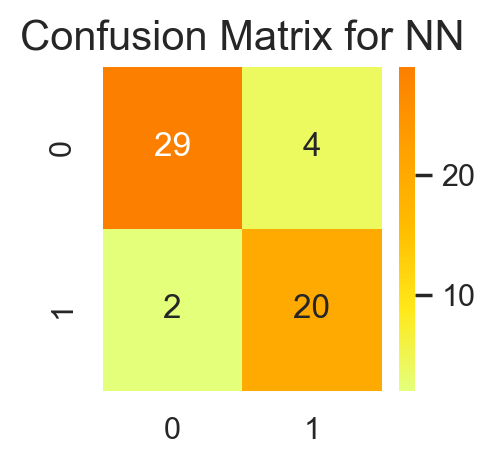

In [485]:
model.eval()
with torch.no_grad():
    predictions = model(x_val)
    predictions = predictions.round()
    cm = confusion_matrix(y_val, predictions)
sns.heatmap(cm, annot = True, cmap = 'Wistia')
plt.title('Confusion Matrix for NN', fontsize = 15)
plt.show()

# Graph

Here, we wrote down all the execution time for the 5th architecture. Where we ran each time on a different number of cores.
We ran it 17 times so we can see the standard deviation and mean of each section.

The PC used in this project includes 8GB and 4 cores (each core can act has 2 cores) ~ hence 8 cores total (Intel Core i7 8th genration).

In [100]:
Execution = pd.read_excel('Desktop/ExecutionTime.xlsx')

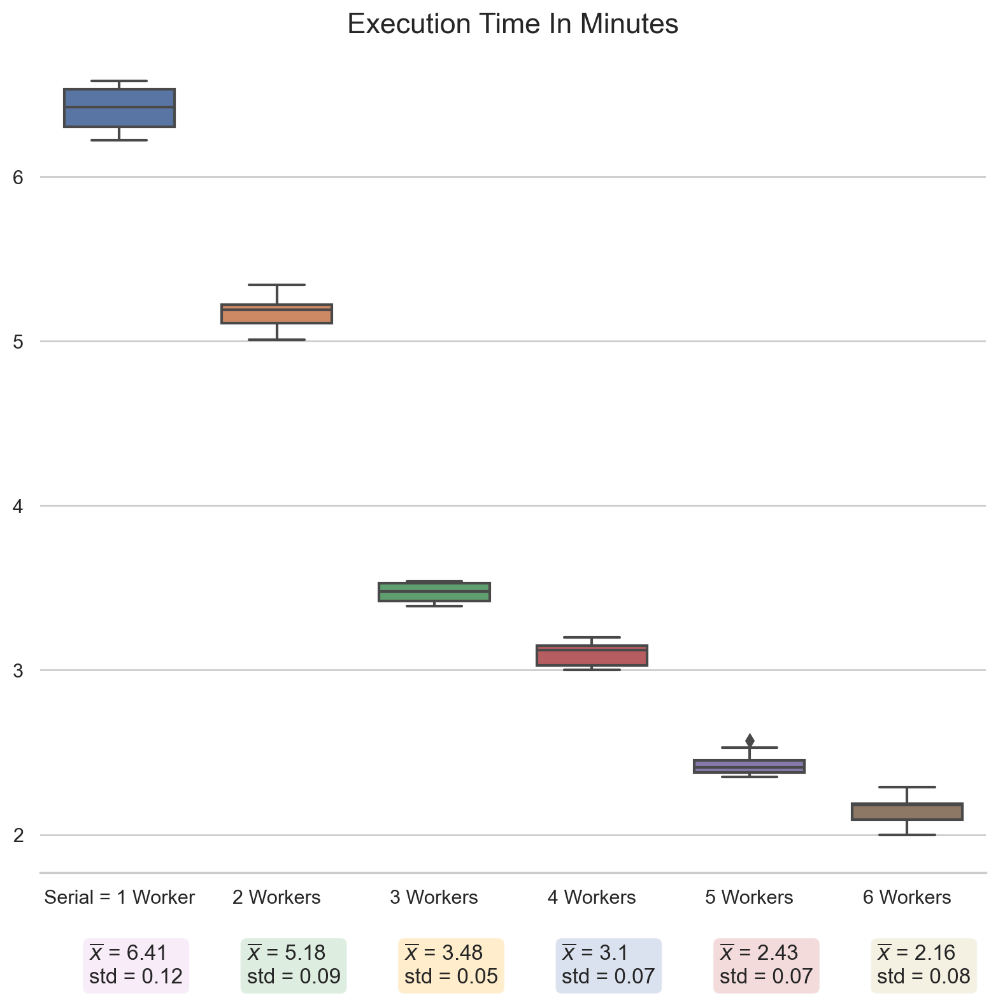

In [101]:
# set style
sns.set(style='whitegrid')

fig, ax = plt.subplots(figsize=(8,8))

g = sns.boxplot(data=Execution, width=0.7)

# Titles and labels
plt.title("Execution Time In Minutes", fontsize=16)

# X tick-labels
xvalues = ["Serial = 1 Worker","2 Workers","3 Workers","4 Workers","5 Workers","6 Workers"] 

# set xvalues as xtick values
plt.xticks(np.arange(6), xvalues)

# remove all borders except bottom
sns.despine(top=True,right=True,left=True,bottom=False)

# Set colors of box plots 
palette= ['plum','g','orange','b','r','y']
continent_colors=["#F0F000","#F00000","#00A000","#00A0F0","#1010F0","#d9cff3"]
continents = list(set(Execution))
color_dict = dict(zip(continents, continent_colors))

mean = round(Execution['Serial = 1 Worker'].mean(),2)
sd = round(Execution['Serial = 1 Worker'].std(),2)
textstr = "$\overline {x}$" + f" = {mean} \nstd = {sd}"
props = dict(boxstyle='round', facecolor='plum', alpha=0.2)
g.text(-0.19, 1.1, textstr, fontsize=12, bbox=props)

mean = round(Execution['2 Workers'].mean(),2)
sd = round(Execution['2 Workers'].std(),2)
textstr = "$\overline {x}$" + f" = {mean} \nstd = {sd}"
props = dict(boxstyle='round', facecolor='g', alpha=0.2)
g.text(.81, 1.1, textstr, fontsize=12, bbox=props)

mean = round(Execution['3 Workers'].mean(),2)
sd = round(Execution['3 Workers'].std(),2)
textstr = "$\overline {x}$" + f" = {mean} \nstd = {sd}"
props = dict(boxstyle='round', facecolor='orange', alpha=0.2)
g.text(1.81, 1.1, textstr, fontsize=12, bbox=props)

mean = round(Execution['4 Workers'].mean(),2)
sd = round(Execution['4 Workers'].std(),2)
textstr = "$\overline {x}$" + f" = {mean} \nstd = {sd}"
props = dict(boxstyle='round', facecolor='b', alpha=0.2)
g.text(2.81, 1.1, textstr, fontsize=12, bbox=props) # 2 for y but covers diamond

mean = round(Execution['5 Workers'].mean(),2)
sd = round(Execution['5 Workers'].std(),2)
textstr = "$\overline {x}$" + f" = {mean} \nstd = {sd}"
props = dict(boxstyle='round', facecolor='r', alpha=0.2)
g.text(3.81, 1.1, textstr, fontsize=12, bbox=props)

mean = round(Execution['6 Workers'].mean(),2)
sd = round(Execution['6 Workers'].std(),2)
textstr = "$\overline {x}$" + f" = {mean} \nstd = {sd}"
props = dict(boxstyle='round', facecolor='y', alpha=0.2)
g.text(4.81, 1.1, textstr, fontsize=12, bbox=props)

    
plt.tight_layout()
plt.show()

# Conclusions

* The work in the field of protrusions appearance and textile surface quality evalu-ation has been widely explored in the literature. There were many who used classical image processing techniques for fabric defect evaluation, while others used fabric de-fect localization and evaluation using Fourier transform and computer vision using the convolutional neural network [18–22].
* In general, expert grading of rested fabric is subjective and, in some cases, difficult to perform. The experts in the field that measuring the fabric physically have a differ-ing wide range of visual abilities as well as opinions on the severity of the defects.
* Common to all of past works in the literature is that they used 2D images of fabric as the starting point of their analysis. A number of publications are devoted to pilling detection and evaluation. One of the first approaches is based on the Gaussian fit the-ory and the use of threshold grading for linear convolution of the pill’s parameters.
* In terms of hyperparameter optimization, there were many approaches cited in the literature. Most of them use GridSearch and RandomSearch, whereas the classic approach iterates over all the parameters given in a certain list.
* Our approach is based on the fact that we can use all the computer power where each execution is independent, and we run it in parallel. This approach expedites execution time by a factor determined by the number of the available computer cores.

# Refrences

1. Skansi, S. Introduction to Deep Learning: From Logical Calculus to Artificial Intelligence; Springer: New York, NY, USA, 2018.
        
2. Reitermanova, Z. Data splitting. In WDS’10 Proceedings of Contributed Papers; Matfyzpress: Prague, Czech Republic, 2010; Volume 10, p. 10.

3. Cherkassky, A.; Weinberg, A. Objective evaluation of textile fabric appearance part 1: Basic principles, protrusion detection, and parameterization. Textile Res. J. 2010, 80, 226–235.

4. Cherkassky, A.; Weinberg, A. Objective Evaluation of Textile Fabric Appearance. Part 2: SET Opti-grade Tester, Grading Algorithms, and Testing. Textile Res. J. 2010, 80, 135–144.

5. Zhang, Y.F.; Bresee, R.R. Fabric defect detection and classification using image analysis. Textile Res. J. 1995, 65, 1–9.

6. Dar, I.M.; Mahmood, W.; Vachtsevanos, G. Automated pilling detection and fuzzy classification of textile fabrics. In Machine Vision Applications in Industrial Inspection V; SPIE: Bellingham, WA, USA, 1997; Volume 3029, pp. 26–36.

7. Abril, H.C.; Garcia-Verela MS, M.; Moreno YM, T.; Navarro, R.F. Automatic method based on image analysis for pilling evaluation in fabrics. Optical Eng. 1998, 37, 2937–2947.

8. Konda, A.; Xin, L.C.; Takadera, M. Evaluation of Pilling by Computer Image Analysis. J. Textile Machin. Soc. Jpn. 1988, 36, 96–107.

9. Ramgulam, R.B.; Amirbayat, J.; Porat, I. The Objective Assessment of Fabric Pilling, Part 1: Methodology. J. Textile Inst. 1993, 84, 221–226.

10. Xu, B. Instrumental Evaluation of Fabric Pilling. J. Textile Inst. 1997, 88, 488–500.

11. His, C.H.; Bresee, R.R.; Annis, P.A. Characterizing Fabric Pilling by Using Image Analysis Techniques, Part 1: Pill Detection and Description. J. Textile Inst. 1997, 88, 80–95.

12. Xin, B.; Hu, J. Objective Evaluation of Fabric Pilling Using Image Analysis Techniques. Textile Res. J. 2002, 72, 1057–1064.

13. Jensen, K.L.; Carstensen, J.M. Fuzz and Pills Evaluated on Knitted Textiles by Image Analysis. Textile Res. J. 2002, 72, 34–38.

14. Behera, B.K.; Madan Mohan, T.E. Objective Measurement of Pilling by Image Processing Technique. Internat. J. Clothing Sci. Technol. 2005, 17, 279–291.

15. Behera, B.K.; Mishra, R. Objective Measurement of Fabric Appearance Using Digital Image Processing. J. Textile Inst. 2006, 97, 147–153.

16. Xu, B. Identifying Fabric Structures with Fast Fourier Transform Techniques. Textile Res. J. 1996, 66, 496–506.

17. Kuo CF, J.; Lee, C.J.; Tsai, C.C. Using a Neural Network to Identify Fabric Defects in Dynamic Cloth Inspection. Textile Res. J. 2003, 73, 238–244.

18. Tilocca, A.; Borzone, P.; Carosio, S.; Durante, A. Detecting Fabric Defects with a Neural Network Using Two Kinds of Optical Patterns. Textile Res. J. 2002, 72, 545–550.

19. Park, S.W.; Hwang, Y.G.; Kang, R.C. Applying Fuzzy Logic and Neural Networks to Total Hand Evaluation of Knitted Fabric, Textile Res. J. 2000, 70, 675–681.

20. Rajasekaran, S. Training-free Counter Propagation Neural Network for Pattern Recognition of Fabric Defects. Textile Res. J. 1997, 67, 401–405.

21. Palmer, S. Objective Classification of Fabric Pilling Based on the Two-dimensional Discrete Wavelet Transform. Textile Res. J. 2003, 73, 713–720.

22. Barrett, G.; Clapp, T.G.; Titus, K. An On-Line Fabric Classification Technique Using a Wavelet-based Neural Network Approach. Textile Res. J. 1996, 66, 521–528.

23. Kim, S.C.; Kang, T.J. Image Analysis of Standard Pilling Photographs Using Wavelet Reconstruction. Textile Res. J. 2005, 75, 801–811.

24. Palmer, S.; Wang, X. Evaluating the Robustness of Objective Pilling Classification with the Two-dimensional Discrete Wavelet Transform. Textile Res. J. 2004, 74, 140–145.

25. Zhang, J.; Wang, X.; Palmer, S. Objective grading of fabric pilling with wavelet texture analysis. Textile Res. J. 2007, 77, 871–879.

26. Shamrat, F.J.M.; Ghosh, P.; Sadek, M.H.; Kazi, M.A.; Shultana, S. Implementation of machine learning algorithms to detect the prognosis rate of kidney disease. In Proceedings of the 2020 IEEE International Conference for Innovation in Technology (INOCON), Bangalore, India, 6–8 November 2020; pp. 1–7.

27. Mohammed, R.; Rawashdeh, J.; Abdullah, M. Machine learning with oversampling and undersampling techniques: Overviewstudy and experimental results. In Proceedings of the 2020 11th International Conference on Information and Communication Systems (ICICS), Irbid, Jordan, 7–9 April 2020; pp. 243–248.

28. Pietersma, D.; Lacroix, R.; Lefebvre, D.; Wade, K.M. Performance analysis for machine-learning experiments using small data sets. Comput. Electron. Agric. 2003, 38, 1–17.